<div style="border: 1px solid black; border-collapse: collapse;border: 2px solid red;border-radius: 12px;padding: 5px;border-style: dashed;"><center><h2> Laptop Price Prediction</h2></center></div>

<p>
This is <u>regression project</u> , where i have scraped Laptop data from E-commerce sites like <u>Flipkart & Croma</u> , Then we  have cleaned and processed our data and applied various Machine Learning <u>Regression</u> models.
</p>

<b>Index for Laptop Data Project</b>

* <b> <a href='#import'>Step 1:- Importing Modules</a></b>
* <b> <a href='#create'>Step 2:- Creating a DataFrame</a></b>
* <b><a href='#Describing'>Step 3:- Describing the Data</a></b>
* <b><a href='#cleaning'>Step 4:- Data cleaning</a></b>
* <b><a href="#processing">Step 5:-Data pre-processing</a></b>
* <b><a href='#Selecting'>Step 6:-Selecting the columns</a></b>
* <b><a href='#Export'>Step 7:-Export your data</a></b>
* <b><a href='#EDA'>Step 8:-EDA & Converting Categorical varaible to Numerical</a></b>
* <b><a href='#Seprate'>Step 9:-Seprate X and Y columns</a></b>
* <b><a href='#Scaling'>Step 10:-Scaling the data</a></b>
* <b><a href='#Scaling'>Step 11:-Feature Selection-PCA, RFE</a></b>
* <b><a href='#Train'>Step 12:-Train-test split</a></b>
* <b><a href='#Model'>Step 13:-Model Training and testing</a></b>
* <b><a href='#Functions'>Step 14:-Functions on Model Training</a></b>
* <b><a href="#help">Step 15:-Model Training with the help of Functions</a></b>
* <b><a href='#Model_'>Step 16:-Model Training</a></b>
* <b><a href='#STACKING'>Step 17:-Stacking</a></b>
* <b><a href='#Statiscs'>Statiscs</a></b>

<div id='import' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 1:- Importing Modules</b></div>

In [84]:
#modin.pandas is used to fasten pandas it uses all the cores of the os
# import ray
# ray.init(runtime_env={'env_vars': {'__MODIN_AUTOIMPORT_PANDAS__': '1'}})
import pandas as pd
import numpy as np
from utils import utils
from sklearn.preprocessing import StandardScaler

<div id='create' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 2:- Creating a DataFrame</b></div>

In [85]:
df=pd.read_json(r"Flipkart_laptop_final1.csv")
croma_df=pd.read_csv(r"croma_data_set_final.csv",index_col=0)
df.head()
croma_df.head()
df = df.append(croma_df, ignore_index = True)


In [86]:
croma_df.head()

,Title,Processor,RAM,Operating_System,Display,Memmory,Prices
0,HP 15s-fq2672TU Intel Core i3 11th Gen (15.6 i...,Intel Core i3 11th Generation,8GB DDR4 RAM,Windows 11 Home,39.6 cms (15.6 inches),512GB SSD ROM,41990
1,"Lenovo IdeaPad 1 AMD Ryzen 5 (15.6 inch, 8GB, ...",AMD Ryzen 5,8GB DDR4 RAM,Windows 11 Home,39.62 cms (15.6 inches),512GB SSD ROM,41990
2,Lenovo IdeaPad 3 14ITL6 Intel Core i3 11th Gen...,Intel Core i3 11th Generation,8GB DDR4 RAM,Windows 11,35.56 cms (14 inches),512GB SSD ROM,43990
3,"Lenovo IdeaPad 1 AMD Ryzen 3 (15.6 inch, 8GB, ...",AMD Ryzen 3,8GB DDR4 RAM,Windows 11 Home,39.62 cms (15.6 inches),512GB SSD ROM,36990
4,Xiaomi NoteBook Pro XMA2006-FK Intel Core i5 1...,Intel Core i5 11th Generation,16GB DDR4 RAM,Windows 11 Home,35.56 cms (14 inches),512GB SSD ROM,57990


<b style="color:red;"><u>Insights</u></b>:-We are creating two Dataframe one is the croma dataset and the normal flipkart dataset then we are appending two Dataframe into one Dataframe.

In [87]:
df

,Title,Rating,Out_of_rating,Processor,RAM,Operating_System,Display,Memmory,Warranty,Other,Prices
0,ASUS Core i7 11th Gen - (16 GB/512 GB SSD/Wind...,,,Intel Core i7 Processor (11th Gen),16 GB DDR4 RAM,Windows 11 Operating System,39.62 cm (15.6 inch) Display,512 GB SSD,1 Year Warranty,,"57,990"
1,Infinix INBook X2 Plus Core i3 11th Gen - (8 G...,4,29,Intel Core i3 Processor (11th Gen),8 GB LPDDR4X RAM,64 bit Windows 11 Operating System,39.62 cm (15.6 Inch) Display,256 GB SSD,1 Year Onsite Warranty,,"32,990"
2,DELL Vostro Core i3 10th Gen - (4 GB/1 TB HDD/...,4.2,48,Intel Core i3 Processor (10th Gen),4 GB DDR4 RAM,64 bit Windows 11 Operating System,35.56 cm (14 inch) Display,1 TB HDD|256 GB SSD,1 Year Onsite Warranty,"Microsoft Office Home and Student 2021 ,","42,290"
3,HP Core i3 11th Gen - (8 GB/512 GB SSD/Windows...,,,Intel Core i3 Processor (11th Gen),8 GB DDR4 RAM,Windows 11 Operating System,39.62 cm (15.6 inch) Display,512 GB SSD,,"1 YEAR ,","43,900"
4,Lenovo IdeaPad 3 Core i3 10th Gen - (8 GB/256 ...,,,Intel Core i3 Processor (10th Gen),8 GB DDR4 RAM,Windows 11 Operating System,39.62 cm (15.6 Inch) Display,256 GB SSD,1 Year Carry-in Warranty,,"33,900"
...,...,...,...,...,...,...,...,...,...,...,...
1399,ASUS ZenBook Flip 13 UX363EA-HP701TS Intel Evo...,NaN,NaN,Intel Core i7 11th Generation,16GB LPDDR4X RAM,Windows 10 Home,33.78 cms (13.3 inches),512GB SSD ROM,NaN,NaN,104990
1400,Dell Inspiron 5410 Intel Core i3 11th Gen (14 ...,NaN,NaN,Intel Core i3 11th Generation,8GB DDR4 RAM,Windows 10 Home,35.56 cms (14 inches),512GB SSD ROM,NaN,NaN,58990
1401,Dell Inspiron 5410 Intel Core i5 11th Gen (14 ...,NaN,NaN,Intel Core i5 11th Generation,16GB DDR4 RAM,Windows 10 Home Single Language,35.56 cms (14 inches),512GB SSD ROM,NaN,NaN,72990
1402,Dell Inspiron 5410 Intel Core i5 11th Gen (14 ...,NaN,NaN,Intel Core i5 11th Generation,8GB DDR4 RAM,Windows 10 Home,35.56 cms (14 inches),512GB SSD ROM,NaN,NaN,69990


<div id='Describing' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 3:- Describing the Data</b></div>

In [88]:
Utils=utils(df)
Utils.basics()

Shape of the Dataframe:- 

Rows:-  1404
Columns:-  11

________________________________________________________________________________________________________

Columns of the Dataframe:-

columns:- Index(['Title', 'Rating', 'Out_of_rating', 'Processor', 'RAM',
       'Operating_System', 'Display', 'Memmory', 'Warranty', 'Other',
       'Prices'],
      dtype='object')


<b style="color:red;"><u>Insights</u></b> :-
* Shape of the DataFrame 
* Columns in a DataFrame

<div id='cleaning' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 4:- Data Cleaning</b></div>

<div  style="border: 1px solid black; border-collapse: collapse;"><b>A)Removing the , $ signs from the price columns</b></div>

In [89]:
df = df.replace(r'^\s*$', np.nan, regex=True)


<div  style="border: 1px solid black; border-collapse: collapse;"><b>B)Viewing the Null/Missing values</b></div>

In [90]:
#Checking for Missing values
df.isnull().sum()

Title                 0
Rating              783
Out_of_rating       783
Processor             0
RAM                   0
Operating_System      0
Display               0
Memmory              16
Warranty            660
Other               847
Prices                0
dtype: int64

In [91]:
Utils.missing()

,column name,datatype,unique,sample_value_of_the_column,Missing values,Missing percentage,category_
1,Rating,object,25,,420,30%,Categorical(mode)
2,Out_of_rating,object,235,,420,30%,Categorical(mode)
8,Warranty,object,47,1 Year Warranty,420,30%,Categorical(mode)
9,Other,object,138,,420,30%,Categorical(mode)
0,Title,object,1099,ASUS Core i7 11th Gen - (16 GB/512 GB SSD/Wind...,0,0%,Categorical(mode)
3,Processor,object,109,Intel Core i7 Processor (11th Gen),0,0%,Categorical(mode)
4,RAM,object,55,16 GB DDR4 RAM,0,0%,Categorical(mode)
5,Operating_System,object,33,Windows 11 Operating System,0,0%,Categorical(mode)
6,Display,object,105,39.62 cm (15.6 inch) Display,0,0%,Categorical(mode)
7,Memmory,object,36,512 GB SSD,0,0%,Categorical(mode)


<div  style="border: 1px solid black; border-collapse: collapse;"><b>C)Dropping colums having a lot of Null/Missing value(Threshold:-30%)</b></div>

In [92]:
#Dropping down the columns with high missing values
df.drop(['Other','Rating','Out_of_rating','Warranty'],axis=1,inplace=True)

In [93]:
#Checking again for missing values
utils_2=utils(df)
utils_2.missing()

,column name,datatype,unique,sample_value_of_the_column,Missing values,Missing percentage,category_
5,Memmory,object,35,512 GB SSD,16,1%,Categorical(mode)
0,Title,object,1099,ASUS Core i7 11th Gen - (16 GB/512 GB SSD/Wind...,0,0%,Categorical(mode)
1,Processor,object,109,Intel Core i7 Processor (11th Gen),0,0%,Categorical(mode)
2,RAM,object,55,16 GB DDR4 RAM,0,0%,Categorical(mode)
3,Operating_System,object,33,Windows 11 Operating System,0,0%,Categorical(mode)
4,Display,object,105,39.62 cm (15.6 inch) Display,0,0%,Categorical(mode)
6,Prices,object,739,"57,990",0,0%,Categorical(mode)


In [94]:
#Checking if there is any columns with missing values
utils_2.check_missing()

['Memmory']


'missing value present'

<a href="#knn">Way for knn imputer</a>

<div id ='processing' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 5:-Data pre-processing</b></div>

<div  style="border: 1px solid black; border-collapse: collapse;"><b>A)Extracting Brand Name out of Title</b></div>

In [95]:
#processing the brand name
def Brand_name(title):
    brand_name=title.split()[0]
    
    brand_name=brand_name.lower()
    if brand_name=='(refurbished)':
        brand_name=title.split()[1]
        brand_name=brand_name.lower()
    return brand_name
df['brand_name']=df['Title'].apply(Brand_name)

In [96]:
#Dropping the title
df.drop('Title',axis=1,inplace=True)

In [97]:
df['brand_name'].value_counts().sort_values(ascending=False)

asus         380
dell         297
hp           281
lenovo       208
acer          84
msi           51
infinix       33
samsung       11
apple         11
gigabyte      10
microsoft     10
fujitsu        7
realme         5
avita          4
xiaomi         4
lg             4
ultimus        3
redmi          1
Name: brand_name, dtype: int64

<div  style="border: 1px solid black; border-collapse: collapse;"><b>B)Performing Data Pre-Processing on the Processor column</b></div>

In [98]:
#Processing the processor
df['Processor'].value_counts()

Intel Core i5 Processor (11th Gen)            128
Intel Core i3 Processor (11th Gen)            121
AMD Ryzen 7 Octa Core Processor                94
AMD Ryzen 5 Hexa Core Processor                84
 Intel Core i5 11th Generation                 80
                                             ... 
AMD Ryzen 5 Dual Core Processor (10th Gen)      1
AMD Ryzen 9 Octa Core Processor (9th Gen)       1
AMD Ryzen 7 Quad Core Processor (11th Gen)      1
AMD Athlon Dual Core Processor (11th Gen)       1
AMD Ryzen 7 Quad Core Processor (3rd Gen)       1
Name: Processor, Length: 109, dtype: int64

In [99]:
def Processor_name(Processor):
    Processor_name=Processor.split('(')[0]
    Processor_name=Processor_name.lower()
    Processor_name=Processor_name.strip(" ")
    return Processor_name

df['Processor_name']=df['Processor'].apply(Processor_name)

In [100]:
def Processor_name(Processor):
    Processor_name=Processor.split('(')
    if len(Processor_name)!=1:
        Processor_name=Processor_name[1]
        Processor_name=Processor_name.lower()
        Processor_name=Processor_name.split('g')
        return Processor_name[0]
    else:
        return "No"

df['Genration']=df['Processor'].apply(Processor_name)

In [101]:
#processing the Genration
df['Genration'].value_counts()

No       762
11th     318
12th     168
10th     116
5th       14
3rd        9
4th        4
6th        4
9th        3
8th        3
7th        2
1st        1
Name: Genration, dtype: int64

In [102]:
df['Processor_name'].replace({"amd ryzen 3 dual core processor":"amd ryzen 3 dual core processor"},inplace=True)

In [103]:
df['Basic_Processor_name']=df['Processor_name']


In [104]:

word_list = ["amd ryzen 7 hexa core processor","amd ryzen 7 octa core processor","amd ryzen 7 quad core processor","intel octa core i7 processor ","amd ryzen 7 quad core processor","amd ryzen 7 quad core processor", 'amd ryzen 7 octa core processor', 'amd ryzen 7 dual core processor','mediatek ryzen 7 quad core processor']
replace_word = 'amd ryzen 7 processor'
def replace_f(word_list,replace_word):
    for itr in word_list:
        df['Basic_Processor_name']=df['Basic_Processor_name'].replace(itr,replace_word)
    return "Done ✔️"
replace_f(word_list,replace_word)

'Done ✔️'

In [105]:
replace_word='amd ryzen 5 processor'
word_list=["amd ryzen 5 octa core processor","amd ryzen 5 quad core processor",'amd ryzen 5 hexa core processor','amd ryzen 5 quad core processor','amd ryzen 5 dual core processor','amd ryzen 5 octa core processor']
replace_f(word_list,replace_word)

'Done ✔️'

In [106]:
replace_word='amd ryzen 9 processor'
word_list=['amd ryzen 9 octa core processor']
replace_f(word_list,replace_word)

'Done ✔️'

In [107]:
replace_word='amd ryzen 3 processor'
word_list=['amd ryzen 3 dual core processor','amd ryzen 3 quad core processor','amd ryzen 3 hexa core processor']
replace_f(word_list,replace_word)


'Done ✔️'

In [108]:
replace_word='intel core i7 processor'
word_list=['intel octa core i7 processor']
replace_f(word_list,replace_word)


'Done ✔️'

In [109]:
replace_word='apple m1 processor'
word_list=['apple m1 pro processor',"apple m1 max processor"]
replace_f(word_list,replace_word)

'Done ✔️'

In [110]:
df.head()

,Processor,RAM,Operating_System,Display,Memmory,Prices,brand_name,Processor_name,Genration,Basic_Processor_name
0,Intel Core i7 Processor (11th Gen),16 GB DDR4 RAM,Windows 11 Operating System,39.62 cm (15.6 inch) Display,512 GB SSD,"57,990",asus,intel core i7 processor,11th,intel core i7 processor
1,Intel Core i3 Processor (11th Gen),8 GB LPDDR4X RAM,64 bit Windows 11 Operating System,39.62 cm (15.6 Inch) Display,256 GB SSD,"32,990",infinix,intel core i3 processor,11th,intel core i3 processor
2,Intel Core i3 Processor (10th Gen),4 GB DDR4 RAM,64 bit Windows 11 Operating System,35.56 cm (14 inch) Display,1 TB HDD|256 GB SSD,"42,290",dell,intel core i3 processor,10th,intel core i3 processor
3,Intel Core i3 Processor (11th Gen),8 GB DDR4 RAM,Windows 11 Operating System,39.62 cm (15.6 inch) Display,512 GB SSD,"43,900",hp,intel core i3 processor,11th,intel core i3 processor
4,Intel Core i3 Processor (10th Gen),8 GB DDR4 RAM,Windows 11 Operating System,39.62 cm (15.6 Inch) Display,256 GB SSD,"33,900",lenovo,intel core i3 processor,10th,intel core i3 processor


In [111]:
df['Processor_name']=df['Processor_name'].str.strip()
data=['3','5','7','9']
for itr in data:
    df['Processor_name']=df['Processor_name'].replace("amd ryzen "+itr+" 3rd gen","amd ryzen "+itr)
    df['Processor_name']=df['Processor_name'].replace("amd ryzen "+itr+" dual core processor","amd ryzen "+itr)
    df['Processor_name']=df['Processor_name'].replace("amd ryzen "+itr+" hexa core processor","amd ryzen "+itr)
    df['Processor_name']=df['Processor_name'].replace("amd ryzen "+itr+" quad core processor","amd ryzen "+itr)
    df['Processor_name']=df['Processor_name'].replace("amd ryzen "+itr+" octa core processor","amd ryzen "+itr)
    df['Processor_name']=df['Processor_name'].replace("amd ryzen "+itr+"-3250u","amd ryzen "+itr)

df['Processor_name']=df['Processor_name'].replace("amd ryzen 7 6800hs","amd ryzen 7")
df['Processor_name']=df['Processor_name'].replace("amd ryzen7 5800h","amd ryzen 7")
for itr in data:
    dat=[
    "intel core i"+itr+" 10th generation",            
    "intel core i"+itr+" 11th gen",                   
    "intel core i"+itr+" 11th generation",        
    "intel core i"+itr+" 12th gen",                 
    "intel core i"+itr+" 12th generation",    
    "intel core i"+itr+" 12th generation",           
    "intel core i"+itr+" 9th generation" ,
    "intel core i"+itr]
    for it in dat:
        df['Processor_name']=df['Processor_name'].replace(it,"intel core i"+itr+" processor")

In [112]:
df['Processor_name']=df['Processor_name'].str.strip('​')
df['Processor_name']=df['Processor_name'].replace("apple m2 processor","apple")
df['Processor_name']=df['Processor_name'].replace("apple m1 processor","apple")
df['Processor_name']=df['Processor_name'].replace("apple m1 max processor","apple")
df['Processor_name']=df['Processor_name'].replace("apple m1 pro processor","apple")
df['Processor_name']=df['Processor_name'].replace("intel octa core i7 processor","intel core i7 processor")

In [113]:
df['Processor_name']=df['Processor_name'].replace("‎intel core i7 12th gen","intel core i7 processor")
df['Processor_name']=df['Processor_name'].replace("intel core i7 12th generation","intel core i7 processor")
df['Processor_name']=df['Processor_name'].replace("intel core i5 12th generation","intel core i5 processor")
df['Processor_name']=df['Processor_name'].replace("intel core i3 12th generation","intel core i3 processor")
df['Processor_name']=df['Processor_name'].replace("mediatek ryzen 7 quad core processor","amd ryzen 7")
df['Processor_name']=df['Processor_name'].replace("windows 11 home","intel core i7 processor")
df['Processor_name'].value_counts().sort_index()
df['Processor_name']=df['Processor_name'].replace("intel celeron dual core processor","intel celeron dual core")

In [114]:
df.drop("Processor",axis=1,inplace=True)

<div  style="border: 1px solid black; border-collapse: collapse;"><b>C)Performing Data Pre-Processing on the RAM column</b></div>

In [115]:
#Processing the RAM Columns
df['RAM'].value_counts()

8 GB DDR4 RAM                     428
16 GB DDR4 RAM                    251
 8GB DDR4 RAM                     187
 16GB DDR4 RAM                    104
16 GB DDR5 RAM                     71
4 GB DDR4 RAM                      66
8 GB LPDDR4X RAM                   37
16 GB LPDDR5 RAM                   31
32 GB DDR5 RAM                     21
16 GB LPDDR4X RAM                  20
 16GB LPDDR4X RAM                  19
 16GB LPDDR5 RAM                   19
 16GB DDR5 RAM                     19
4 GB LPDDR4 RAM                    10
 8GB LPDDR4X RAM                    8
32 GB DDR4 RAM                      8
 16GB LPDDR4 RAM                    8
 32GB DDR5 RAM                      7
8 GB DDR3 RAM                       7
 4GB DDR4 RAM                       6
4 GB DDR3 RAM                       6
4 GB LPDDR4X RAM                    5
 16GB RAM                           4
 16GB DDR4                          4
 8GB LPDDR5 RAM                     4
32 GB LPDDR5 RAM                    4
8 GB DDR2 RA

In [116]:
df['Basic_Ram']=df['RAM']

In [117]:
def replace_f(word_list,replace_word):
    for itr in word_list:
        df['Basic_Ram']=df['Basic_Ram'].replace(itr,replace_word)
    return "Done ✔️"

replace_word=4
word_list=['4 GB DDR4 RAM',"4 GB DDR3 RAM",'4 GB LPDDR4X RAM','4 GB LPDDR4 RAM','4 GB LPDDR4 RAM']
replace_f(word_list,replace_word)

'Done ✔️'

In [118]:
replace_word=8
word_list=['8 GB DDR4 RAM',"8 GB LPDDR4X RAM",'8 GB Unified Memory RAM','8 GB DDR3 RAM','8 GB DDR2 RAM','8 GB DDR5 RAM','8 GB LPDDR4 RAM']
replace_f(word_list,replace_word)

'Done ✔️'

In [119]:
replace_word=16
word_list=['16 GB DDR4 RAM',"16 GB DDR5 RAM",'16 GB LPDDR5 RAM','16 GB Unified Memory RAM','16 GB LPDDR4 RAM','16 GB LPDDR4X RAM']
replace_f(word_list,replace_word)

'Done ✔️'

In [120]:
replace_word=32
word_list=['32 GB DDR5 RAM',"32 GB DDR4 RAM",'32 GB LPDDR5 RAM','32 GB LPDDR4X RAM','32 GB Unified Memory RAM']
replace_f(word_list,replace_word)

'Done ✔️'

In [121]:
replace_word=64
word_list=['64 GB DDR4 RAM']
replace_f(word_list,replace_word)

'Done ✔️'

In [122]:
df['RAM']=df['RAM'].str.strip()
df['RAM']=df['RAM'].replace('16GB DDR4 RAM',"16 GB DDR4 RAM")
df['RAM']=df['RAM'].replace('16GB DDR4',"16 GB DDR4 RAM")
df['RAM']=df['RAM'].replace('16GB',"16 GB DDR4 RAM")
df['RAM']=df['RAM'].replace('8GB RAM',"8 GB DDR4 RAM")
df['RAM']=df['RAM'].replace('8GB DDR4 SDRAM RAM',"8 GB DDR4 RAM")
df['RAM']=df['RAM'].replace('8GB DDR4 RAM',"8 GB DDR4 RAM")
df['RAM']=df['RAM'].replace("8GB DDR4","8 GB DDR4 RAM")
df['RAM']=df['RAM'].replace("8GB LPDDR2L RAM","8 GB LPDDR4X RAM")
df['RAM']=df['RAM'].replace("8GB LPDDR4X RAM","8 GB LPDDR4X RAM")
df['RAM']=df['RAM'].replace("8GB LPDDR4 RAM","8 GB LPDDR4X RAM")
df['RAM']=df['RAM'].replace("8 GB LPDDR4 RAM","8 GB LPDDR4X RAM")
df['RAM']=df['RAM'].replace("4GB DDR4 RAM","4 GB DDR4 RAM")
df['RAM']=df['RAM'].replace('16GB RAM',"16 GB DDR4 RAM")
df['RAM']=df['RAM'].replace('16 GB LPDDR4X RAM',"16 GB LPDDR4 RAM")
df['RAM']=df['RAM'].replace("16GB DDR5",'16GB DDR5 RAM')
df['RAM']=df['RAM'].replace("16GB LPDDR4X RAM","16GB LPDDR4 RAM")
df['RAM']=df['RAM'].replace("16GB LPDDR4X-4266","16GB LPDDR4 RAM")
df['RAM']=df['RAM'].replace("16GB LDDR4x RAM","16GB LPDDR4 RAM")
df['RAM']=df['RAM'].replace("16GB LDDR5","16GB LPDDR5 RAM")
df['RAM']=df['RAM'].replace("16GB LPDDR4 RAM","16GB LPDDR4 RAM")
df['RAM']=df['RAM'].replace("16 GB LPDDR4 RAM","16GB LPDDR4 RAM")
df['RAM']=df['RAM'].replace("32GB DDR5","32GB DDR5 RAM")
df['RAM']=df['RAM'].replace("32GB LPDDR5 RAM","32GB LPDDR5 RAM")
df['RAM']=df['RAM'].replace("32GB LPDD4 RAM","32GB LPDDR4 RAM")
df['RAM']=df['RAM'].replace("16GB LPDDR5 RAM","16 GB LPDDR5 RAM")
df['RAM']=df['RAM'].replace("16GB DDR5 RAM","16 GB DDR5 RAM")
df['RAM']=df['RAM'].replace("AMD Ryzen5","8 GB DDR4 RAM")
df['RAM']=df['RAM'].replace("Intel Core i7 12th Generation","16 GB DDR4 RAM")
data=['16','32','4','8']
for itr in data:
    df['RAM']=df['RAM'].replace(itr+"GB DDR5 RAM",itr+" GB DDR5 RAM")
    df['RAM']=df['RAM'].replace(itr+"GB LPDDR5 RAM",itr+" GB LPDDR5 RAM")
    df['RAM']=df['RAM'].replace(itr+"GB DDR5",itr+"GB DDR5 RAM")
    df['RAM']=df['RAM'].replace(itr+"GB LPDDR4X RAM",itr+"GB LPDDR4 RAM")

df['RAM'].value_counts().sort_index()

12GB DDR4 RAM                 1
16 GB DDR4 RAM              364
16 GB DDR5 RAM               91
16 GB LPDDR5 RAM             51
16 GB Unified Memory RAM      3
16GB LPDDR4 RAM              50
16GB LPDDR5L RAM              2
32 GB DDR4 RAM                8
32 GB DDR5 RAM               29
32 GB LPDDR4X RAM             1
32 GB LPDDR5 RAM              7
32 GB Unified Memory RAM      1
32GB DDR4 RAM                 1
32GB LDDR5 RAM                1
4 GB DDR3 RAM                 6
4 GB DDR4 RAM                72
4 GB LPDDR4 RAM              10
4 GB LPDDR4X RAM              5
4GB LPDDR4 RAM                5
64 GB DDR4 RAM                1
8 GB DDR2 RAM                 4
8 GB DDR3 RAM                 7
8 GB DDR4 RAM               622
8 GB DDR5 RAM                 3
8 GB LPDDR4X RAM             50
8 GB LPDDR5 RAM               4
8 GB Unified Memory RAM       4
8GB LPDDR3 RAM                1
Name: RAM, dtype: int64

<div  style="border: 1px solid black; border-collapse: collapse;"><b>D)Performing Data Pre-Processing on the Operating System column</b></div>

In [123]:
#Operating_System the processor
df['Operating_System'].value_counts()

64 bit Windows 11 Operating System       575
 Windows 11 Home                         236
64 bit Windows 10 Operating System       167
Windows 11 Operating System              157
 Windows 10 Home                          82
Windows 10 Operating System               33
 Windows 11                               33
 Windows 10                               16
DOS Operating System                      13
Mac OS Operating System                   11
Chrome Operating System                    9
64 bit DOS Operating System                8
 Windows 11                                7
 Intel Iris Xe                             7
 Chrome OS                                 6
 Windows 10 Home Single Language           6
32 bit Windows 11 Operating System         5
 Windows 11​                               5
 Windows 11 Home Single Language           5
 Windows 11 Pro                            4
64 bit Chrome Operating System             4
 Windows 10 Pro                            2
 Windows 1

In [124]:
df['Basic_Operating_System']=df['Operating_System']

In [125]:
def replace_f(word_list,replace_word):
    for itr in word_list:
        df['Basic_Operating_System']=df['Basic_Operating_System'].replace(itr,replace_word)
    return "Done ✔️"
word_list=['64 bit Windows 10 Operating System']
replace_word='Windows 10 Operating System'
replace_f(word_list,replace_word)

'Done ✔️'

In [126]:
word_list=['64 bit Windows 11 Operating System','32 bit Windows 11 Operating System']
replace_word='Windows 11 Operating System'
replace_f(word_list,replace_word)

'Done ✔️'

In [127]:
word_list=['32 bit Chrome Operating System','64 bit Chrome Operating System']
replace_word='Chrome Operating System'
replace_f(word_list,replace_word)

'Done ✔️'

In [128]:
replace_word='Windows 7 Operating System'
word_list=['64 bit Windows 7 Operating System']
replace_f(word_list,replace_word)

'Done ✔️'

In [129]:
replace_word='DOS Operating System'
word_list=['64 bit DOS Operating System']
replace_f(word_list,replace_word)

'Done ✔️'

In [130]:
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 11​',"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 11 Pro',"Windows 11 Operating System")

df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 11 Home English',"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 11',"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 11 ',"Windows 11 Operating System")

df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 11 Home',"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 11 Home Basic',"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace('Windows 11',"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 11 Home Single Language',"Windows 11 Operating System")

df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 10 Home',"Windows 10 Operating System")

df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 10',"Windows 10 Operating System")

df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 10 Home Single Language',"Windows 10 Operating System")

df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 10 Home Single Plus Language',"Windows 10 Operating System")

df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 10 Pro',"Windows 10 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Windows 10 Home Single Language Plus',"Windows 10 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Chrome OS',"Chrome Operating System")

df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Intel Iris Xe' ,"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' Intel UHD Graphics' ,"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' NVIDIA GeForce RTX 3060' ,"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' NVIDIA GeForce RTX 3050' ,"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' AMD Radeon' ,"Windows 11 Operating System")
df['Basic_Operating_System']=df['Basic_Operating_System'].replace(' NVIDIA GeForce GTX 1650' ,"Windows 11 Operating System")             
df['Basic_Operating_System'].value_counts()

Windows 11 Operating System    1042
Windows 10 Operating System     309
DOS Operating System             21
Chrome Operating System          20
Mac OS Operating System          11
Windows 7 Operating System        1
Name: Basic_Operating_System, dtype: int64

<div  style="border: 1px solid black; border-collapse: collapse;"><b>E)Performing Data Pre-Processing on the  Memmory column</b></div>

In [131]:
#Processing the Memmory
df['Memmory'].value_counts()
df['Memmory']=df['Memmory'].replace('1 TB HDD|1 TB SSD',"1 TB SSD")
df['Memmory']=df['Memmory'].replace('1 TB HDD|512 GB SSD',"512 GB SSD")
df['Memmory']=df['Memmory'].replace('512 GB HDD|512 GB SSD',"512 GB SSD")
df['Memmory']=df['Memmory'].replace('1 TB HDD|256 GB SSD',"256 GB SSD")


df['Memmory']=df['Memmory'].replace(' 512GB SSD ROM',"512 GB SSD")
df['Memmory']=df['Memmory'].replace(' 1TB SSD ROM',"1 TB SSD")
df['Memmory']=df['Memmory'].replace(' 256GB SSD ROM',"256 GB SSD")
df['Memmory']=df['Memmory'].replace(' 1TB HDD & 256GB SSD ROM',"256 GB SSD")
df['Memmory']=df['Memmory'].replace(' 1TB HDD ROM',"1 TB HDD")
df['Memmory']=df['Memmory'].replace('500 GB HDD',"512 GB HDD")

df['Memmory']=df['Memmory'].replace(' 1TB PCIe 4.0 NVMe M.2 SSD',"1 TB SSD")
df['Memmory']=df['Memmory'].replace(' 512 GB PCIe NVMe M.2 SSD',"512 GB SDD")
df['Memmory']=df['Memmory'].replace(' 1TB SSD ROM',"1 TB SSD")
df['Memmory']=df['Memmory'].replace(' 128GB eMMC ROM ',"128 GB SSD")
df['Memmory']=df['Memmory'].replace(' 512GB SSD ROM',"512 GB SDD")
df['Memmory']=df['Memmory'].replace(' 1TB HDD & 128GB SSD ROM',"128 GB SSD")
df['Memmory']=df['Memmory'].replace(' 1TB SSD ROM',"1 TB SSD")
df['Memmory']=df['Memmory'].replace(' 128GB SSD ROM',"128 GB SSD")
df['Memmory']=df['Memmory'].replace(' 128GB eMMC ROM',"128 GB SSD")
df['Memmory']=df['Memmory'].replace(' 512GB PCIe 4.0 NVMe M.2 SSD',"512 GB SDD")
df['Memmory']=df['Memmory'].replace(' 512GB NVMe PCIe Gen3 SSD',"512 GB SDD")
df['Memmory']=df['Memmory'].replace(' 512GB NVMe SSD ROM',"512 GB SDD")
df['Memmory']=df['Memmory'].replace('512GB SSD ROM',"512 GB SDD")
df['Memmory']=df['Memmory'].replace(' 512GB SSD',"512 GB SDD")
df['Memmory']=df['Memmory'].replace('512 GB SDD',"512 GB SDD")
df['Memmory']=df['Memmory'].replace(' 512GB SSD ROM',"512 GB SDD")
df['Memmory']=df['Memmory'].replace(' 512GB SSD ROM​',"512 GB SDD")
df['Memmory']=df['Memmory'].replace('512 GB SDD',"512 GB SSD")
df['Memmory']=df['Memmory'].replace(' 2TB SSD ROM',"2 TB SSD")
df['Memmory']=df['Memmory'].replace(' 2TB PCIe 4.0 NVMe M.2 SSD',"2 TB SSD")
df['Memmory']=df['Memmory'].replace(' 1 TB PCIe NVMe M.2 SSD',"1 TB SSD")
df['Memmory']=df['Memmory'].replace(' 1TB SSD ROM​',"1 TB SSD")
df['Memmory']=df['Memmory'].replace(' 64GB eMMC ROM',"64 GB SSD")

df['Memmory'].value_counts()
# df.dropna(inplace=True)

512 GB SSD    803
256 GB SSD    246
1 TB SSD      230
1 TB HDD       57
128 GB SSD     23
2 TB SSD       13
512 GB HDD      6
64 GB SSD       5
320 GB HDD      4
256 GB HDD      1
Name: Memmory, dtype: int64

<div  style="border: 1px solid black; border-collapse: collapse;"><b>F)Performing Data Pre-Processing on the Display in cm column</b></div>

In [132]:
#processing the display
df['Display_in_cm']=df['Display'].str.split(" ",n=1, expand = True)[0]
df['Display_in_cm']=df['Display_in_cm'].replace('PCI-e',39.62)
df['Display_in_cm']=df['Display_in_cm'].replace('Matrix',39.62)

In [133]:
def first_four(Display):
    return Display[:4]
df['Display_in_cm']=df['Display'].apply(first_four)
df['Display_in_cm'].value_counts()

39.6    519
35.5    231
 39.    208
 35.    118
 33.     41
40.6     41
33.7     28
40.8     27
43.9     19
 40.     17
14 i     17
29.4     16
34.0     16
 34.     13
35.8     11
 43.     10
38.0      9
36.8      8
15.6      8
38.1      6
PCI-      5
 31.      3
41.1      3
 36.      3
Stee      3
11.2      3
34.5      3
 38.      2
 29.      2
14.1      2
34.2      2
13.3      1
33.0      1
36.0      1
25.6      1
2.84      1
27.9      1
 60.      1
 32.      1
 28.      1
88.9      1
Name: Display_in_cm, dtype: int64

In [134]:
df['Display_in_cm']=df['Display_in_cm'].replace('PCI-',39.62)
df['Display_in_cm']=df['Display_in_cm'].replace('Stee',39.62)
df['Display_in_cm']=df['Display_in_cm'].replace('14 i',35.62)
df['Display_in_cm']=df['Display_in_cm'].astype('float64')

In [135]:
Utils.datatypes_data()

,Column_Name,datatype,unique,sample_value_of_the_column,Number_of_missing_value_present
0,Title,object,1099,ASUS Core i7 11th Gen - (16 GB/512 GB SSD/Wind...,0
1,Rating,object,25,,420
2,Out_of_rating,object,235,,420
3,Processor,object,109,Intel Core i7 Processor (11th Gen),0
4,RAM,object,55,16 GB DDR4 RAM,0
5,Operating_System,object,33,Windows 11 Operating System,0
6,Display,object,105,39.62 cm (15.6 inch) Display,0
7,Memmory,object,36,512 GB SSD,0
8,Warranty,object,47,1 Year Warranty,420
9,Other,object,138,,420


<div  style="border: 1px solid black; border-collapse: collapse;"><b>G)Performing Data Pre-Processing on the Price column</b></div>

In [136]:
#processing the prices
df["Prices"] =df['Prices'].replace('[\$,]', '', regex=True).astype(float)

In [137]:
df.head()

,RAM,Operating_System,Display,Memmory,Prices,brand_name,Processor_name,Genration,Basic_Processor_name,Basic_Ram,Basic_Operating_System,Display_in_cm
0,16 GB DDR4 RAM,Windows 11 Operating System,39.62 cm (15.6 inch) Display,512 GB SSD,57990.0,asus,intel core i7 processor,11th,intel core i7 processor,16,Windows 11 Operating System,39.6
1,8 GB LPDDR4X RAM,64 bit Windows 11 Operating System,39.62 cm (15.6 Inch) Display,256 GB SSD,32990.0,infinix,intel core i3 processor,11th,intel core i3 processor,8,Windows 11 Operating System,39.6
2,4 GB DDR4 RAM,64 bit Windows 11 Operating System,35.56 cm (14 inch) Display,256 GB SSD,42290.0,dell,intel core i3 processor,10th,intel core i3 processor,4,Windows 11 Operating System,35.5
3,8 GB DDR4 RAM,Windows 11 Operating System,39.62 cm (15.6 inch) Display,512 GB SSD,43900.0,hp,intel core i3 processor,11th,intel core i3 processor,8,Windows 11 Operating System,39.6
4,8 GB DDR4 RAM,Windows 11 Operating System,39.62 cm (15.6 Inch) Display,256 GB SSD,33900.0,lenovo,intel core i3 processor,10th,intel core i3 processor,8,Windows 11 Operating System,39.6


<b>Note:- </b>Processing the data completed ✅ 

<div id="Selecting"  style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 6:-Selecting the Columns </b></div>

In [138]:
df1=pd.DataFrame(df[['brand_name','Memmory','Basic_Operating_System','RAM',"Processor_name",'Display_in_cm','Prices']])
df2=pd.DataFrame(df[['brand_name','Memmory',"Basic_Operating_System","RAM",'Display_in_cm','Prices']])

In [139]:
df1.isnull().sum()

brand_name                 0
Memmory                   16
Basic_Operating_System     0
RAM                        0
Processor_name             0
Display_in_cm              0
Prices                     0
dtype: int64

<div id="Export"  style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 7:-Export Data </b></div>

In [140]:
df1.to_excel("Laptop_cleanning.xlsx")

<div id="EDA"  style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 8:-EDA & Converting Categorical varaible to Numerical</b></div>

In [141]:
import seaborn as sns
import matplotlib.pyplot as plt

In [142]:
print("Minimium Prices:- ",df1['Prices'].min())
print("Maximium Prices:- ",df1['Prices'].max())

Minimium Prices:-  15990.0
Maximium Prices:-  419999.0


<div  style="border: 1px solid black; border-collapse: collapse;"><b>A)EDA on Processor</b></div>

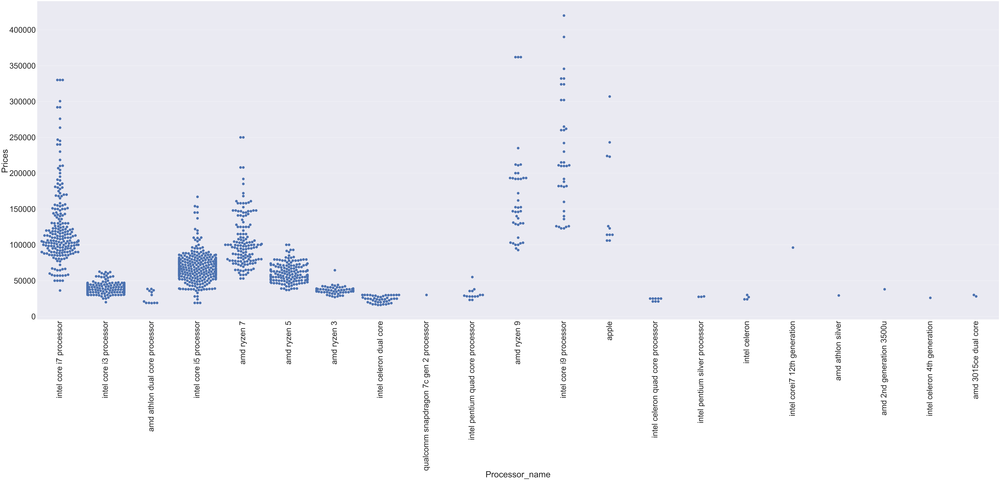

In [143]:
#Swarmplot on the basis of processor wrt to prices
sns.set(rc={'figure.figsize':(120,40)})
sns.set(font_scale=5 )
sns.swarmplot(x ='Processor_name', y ='Prices',size=18 ,data = df1)
plt.xticks(rotation=90)
plt.show()

In [144]:
n=df1['Processor_name'].unique()

Processor=[]
Median=[]
mean=[]
count=[]
for itr in n:
    Processor.append(itr)
    a=df1[df1['Processor_name']==itr]
    Median.append(a['Prices'].median())
    mean.append(a['Prices'].mean())
    count.append(a['Prices'].count())
med=pd.DataFrame(list(zip(Processor,Median,mean,count)),columns=['Processor Name','Median Prices','Mean Prices','Count'])
med.sort_values("Median Prices")

,Processor Name,Median Prices,Mean Prices,Count
7,intel celeron dual core,24500.0,24114.266667,45
13,intel celeron quad core processor,24999.0,23495.625000,8
15,intel celeron,25492.0,26241.000000,4
2,amd athlon dual core processor,25494.5,27421.250000,12
19,intel celeron 4th generation,25950.0,25950.000000,1
14,intel pentium silver processor,27490.0,27656.666667,3
9,intel pentium quad core processor,28580.5,31370.857143,14
20,amd 3015ce dual core,28994.0,28994.000000,2
17,amd athlon silver,29350.0,29350.000000,1
8,qualcomm snapdragon 7c gen 2 processor,29999.0,29999.000000,1


In [145]:
#Converting data to numerical on the basis of EDA
rep={
"amd 2nd generation 3500u":5,
"amd 3015ce dual core":3,
"amd athlon dual core processor":1,
"amd athlon silver":4,
"amd ryzen 3":5,
"amd ryzen 5":7,
"amd ryzen 7":10,
"amd ryzen 9":13,
"apple" :12,
    "intel celeron dual core":0,
"intel celeron":1,
    "qualcomm snapdragon 7c gen 2 processor":4,
"intel celeron 4th generation":1,
"intel celeron dual core":0,
"intel celeron dual core processor":0,
"intel celeron quad core processor":0,
"intel core i3 processor": 6,
"intel core i5 processor":8,
"intel core i7 processor":11,
"intel corei7 12th generation":9,
"intel core i9 processor":14,
"intel pentium quad core processor":3,
"intel pentium silver processor":2}
df1['Processor_name']=df1['Processor_name'].map(rep)

<div  style="border: 1px solid black; border-collapse: collapse;"><b>B)EDA on Brand Name</b></div>

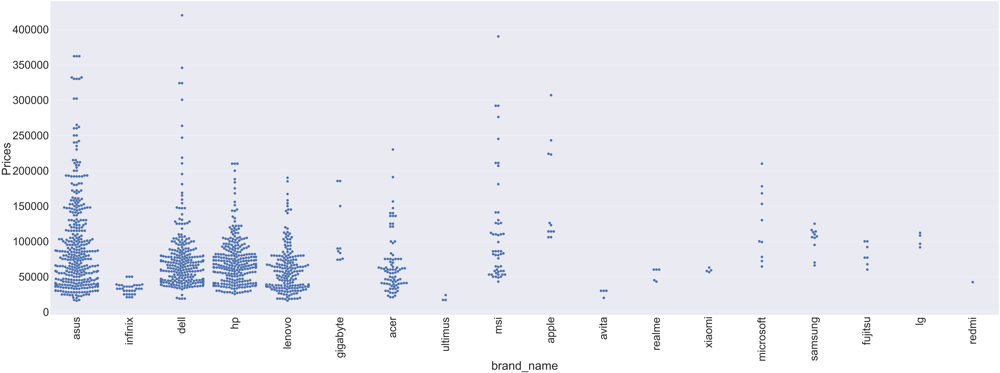

In [146]:
sns.set(rc={'figure.figsize':(120,40)})
sns.set(font_scale=7 )
sns.swarmplot(x ='brand_name', y ='Prices',size=18 ,data = df1)
plt.xticks(rotation=90)
plt.show()

In [147]:
n=df1['brand_name'].unique()

brand=[]
Median=[]
mean=[]
for itr in n:
    brand.append(itr)
    a=df1[df1['brand_name']==itr]
    Median.append(a['Prices'].median())
    mean.append(a['Prices'].mean())
med=pd.DataFrame(list(zip(brand,Median,mean)),columns=['Brand Name','Median Prices','Mean Prices'])
med

,Brand Name,Median Prices,Mean Prices
0,asus,77740.0,96156.489474
1,infinix,32990.0,33264.090909
2,dell,62994.0,74357.265993
3,hp,66994.0,72289.733096
4,lenovo,52740.0,59608.288462
5,gigabyte,87990.0,109390.000000
6,acer,57747.0,66794.000000
7,ultimus,16990.0,19323.333333
8,msi,85990.0,112312.352941
9,apple,122990.0,163626.363636


In [148]:
#Converting Brand Name to numbers
map_brand_name={
'asus' : 10,
'dell' :7,
'hp' :7,
'lenovo':5,
'acer' :6,
'msi':8,
'infinix':3,
'apple' :12,
"gigabyte" :8,
"realme" :4,
"avita" :2,
"ultimus":1,
"samsung":11,
"microsoft":12,
"fujitsu":9,
"lg":11,
  "xiaomi":5 

}
df1['brand_name']=df1['brand_name'].map(map_brand_name)
##Dropping redmi code
# x.drop(1265,inplace=True)
# y.drop(1265,inplace=True)
#lets try knn imputer

<div  style="border: 1px solid black; border-collapse: collapse;"><b>C)EDA on Memmory</b></div>

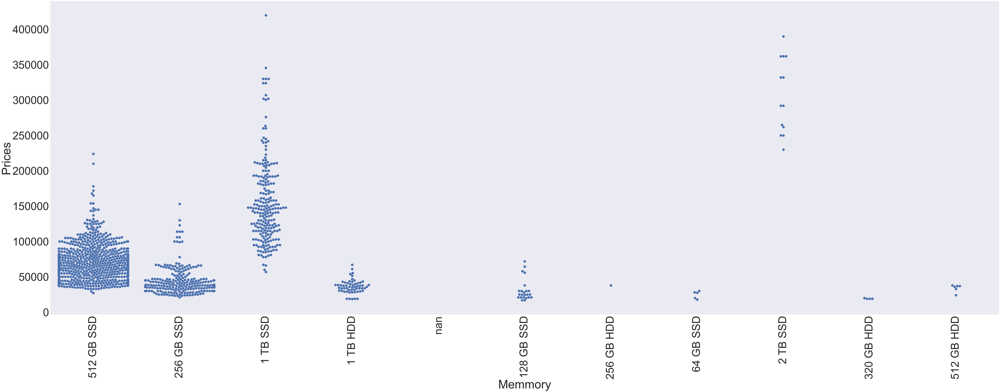

In [149]:
sns.set(rc={'figure.figsize':(120,40)})
sns.set(font_scale=7 )
sns.swarmplot(x ='Memmory', y ='Prices',size=18 ,data = df1)
plt.xticks(rotation=90)
plt.show()

In [150]:
n=df1['Memmory'].unique()

Memmory=[]
Median=[]
mean=[]
for itr in n:
    Memmory.append(itr)
    a=df1[df1['Memmory']==itr]
    Median.append(a['Prices'].median())
    mean.append(a['Prices'].mean())
med=pd.DataFrame(list(zip(Memmory,Median,mean)),columns=['Memmory','Median Prices','Mean Prices'])
med

,Memmory,Median Prices,Mean Prices
0,512 GB SSD,67500.0,70607.174346
1,256 GB SSD,38494.5,44388.930894
2,1 TB SSD,144994.5,154509.260870
3,1 TB HDD,35990.0,36411.649123
4,NaN,NaN,NaN
5,128 GB SSD,24999.0,31276.782609
6,256 GB HDD,37890.0,37890.000000
7,64 GB SSD,27490.0,24693.400000
8,2 TB SSD,291990.0,306220.769231
9,320 GB HDD,18999.0,19249.000000


In [151]:
#Converting Memmory to number
map_Memmory={
'512 GB SSD' :0,
'256 GB SSD' :1,
'1 TB SSD' :2,
'1 TB HDD' : 3,
'128 GB SSD':4,
'2 TB SSD':5,
'512 GB HDD' :6,
'320 GB HDD': 7,
'256 GB HDD':8,
'64 GB SSD':9 
            }
df1['Memmory']=df1['Memmory'].map(map_Memmory)

<div  style="border: 1px solid black; border-collapse: collapse;"><b>E)EDA on RAM</b></div>

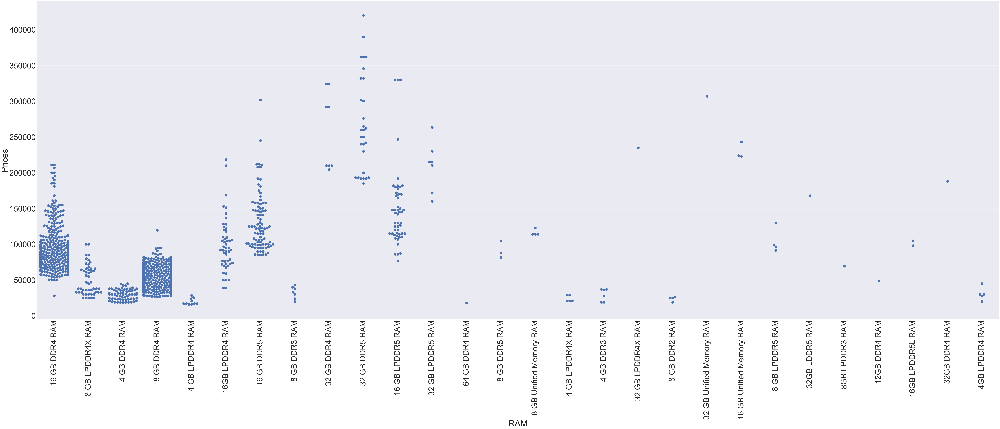

In [152]:
sns.set(rc={'figure.figsize':(120,40)})
sns.set(font_scale=5 )
sns.swarmplot(x ='RAM', y ='Prices',size=18 ,data = df1)
plt.xticks(rotation=90)
plt.show()

In [153]:
n=df1['RAM'].unique()

Memmory=[]
Median=[]
mean=[]
count=[]
for itr in n:
    Memmory.append(itr)
    a=df1[df1['RAM']==itr]
    Median.append(a['Prices'].median())
    mean.append(a['Prices'].mean())
    count.append(a['Prices'].nunique())
med=pd.DataFrame(list(zip(Memmory,Median,mean,count)),columns=['RAM','Median Prices','Mean Prices',"count"])
med.sort_values('Median Prices')

,RAM,Median Prices,Mean Prices,count
4,4 GB LPDDR4 RAM,17099.0,19862.800000,8
12,64 GB DDR4 RAM,17999.0,17999.000000,1
15,4 GB LPDDR4X RAM,20990.0,24190.000000,2
18,8 GB DDR2 RAM,24999.0,23874.000000,3
2,4 GB DDR4 RAM,29940.0,29321.958333,42
27,4GB LPDDR4 RAM,29994.0,30491.600000,4
16,4 GB DDR3 RAM,31999.5,29332.833333,4
7,8 GB DDR3 RAM,32899.0,32542.285714,7
1,8 GB LPDDR4X RAM,41490.0,50166.680000,26
3,8 GB DDR4 RAM,48492.0,51667.180064,299


In [154]:
#Converting RAM to number
RAM_map={
"8 GB DDR4 RAM":0,
"16 GB DDR4 RAM":1,
"16 GB DDR5 RAM":2,
"4 GB DDR4 RAM":3,
"16 GB LPDDR5 RAM":4,
"8 GB LPDDR4X RAM":5,
"16GB LPDDR4 RAM":6,
"32 GB DDR5 RAM":8,
"32 GB DDR4 RAM":8,
"32 GB LPDDR5 RAM":9,
"8 GB DDR3 RAM":10,
"4 GB DDR3 RAM":11,
"4GB LPDDR4 RAM":3,
"8 GB Unified Memory RAM":13,
"8 GB DDR2 RAM":14,
"8 GB LPDDR5 RAM": 15,
"8 GB DDR5 RAM":16,
"4 GB LPDDR4 RAM":17,
'16 GB Unified Memory RAM':18,
'4 GB LPDDR4X RAM':19,
"16GB LPDDR5L RAM":20,
"32 GB LPDDR4X RAM":  21,
"32 GB Unified Memory RAM" :22,
"32GB LDDR5 RAM":  23,
"8GB LPDDR3 RAM":24,
"12GB DDR4 RAM":25,
"32GB DDR4 RAM":8}
df1['RAM']=df1['RAM'].map(RAM_map)

In [155]:
df1[df1['RAM']=='64 GB DDR4 RAM']

,brand_name,Memmory,Basic_Operating_System,RAM,Processor_name,Display_in_cm,Prices


<a href='https://www.flipkart.com/lenovo-celeron-dual-core-64-gb-64-gb-ssd-16-emmc-storage-chrome-os-4-graphics-cb-11igl05-chromebook/p/itmec579ace5d4f2'><b>Link</b></a>

In [156]:
df1.drop(206,axis=0,inplace=True)

In [157]:
df1.isnull().sum()

brand_name                 1
Memmory                   16
Basic_Operating_System     0
RAM                        0
Processor_name             0
Display_in_cm              0
Prices                     0
dtype: int64

<div  style="border: 1px solid black; border-collapse: collapse;"><b>E)EDA on OS</b></div>

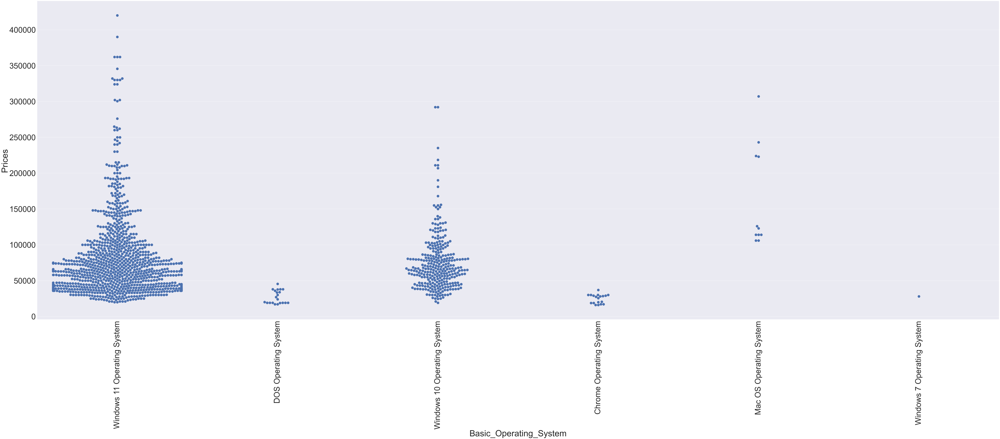

In [158]:
sns.set(rc={'figure.figsize':(120,40)})
sns.set(font_scale=5 )
sns.swarmplot(x ='Basic_Operating_System', y ='Prices',size=18 ,data = df1)
plt.xticks(rotation=90)
plt.show()

In [159]:
n=df1['Basic_Operating_System'].unique()

Basic_Operating_System=[]
Median=[]
mean=[]
count=[]
for itr in n:
    Basic_Operating_System.append(itr)
    a=df1[df1['Basic_Operating_System']==itr]
    Median.append(a['Prices'].median())
    mean.append(a['Prices'].mean())
    count.append(a['Prices'].nunique())
med=pd.DataFrame(list(zip(Basic_Operating_System,Median,mean,count)),columns=['Basic_Operating_System','Median Prices','Mean Prices',"count"])
med.sort_values('Median Prices')

,Basic_Operating_System,Median Prices,Mean Prices,count
1,DOS Operating System,23999.0,27058.761905,15
3,Chrome Operating System,27490.0,24652.263158,14
5,Windows 7 Operating System,27999.0,27999.000000,1
0,Windows 11 Operating System,65424.5,81314.070058,479
2,Windows 10 Operating System,66500.0,74852.588997,208
4,Mac OS Operating System,122990.0,163626.363636,8


In [160]:
#Converting OS to number
Basic_Operating_System_map={
   'Windows 11 Operating System':3,
    'Windows 10 Operating System':3,
    'DOS Operating System':1,
    'Chrome Operating System':2,
    "Windows 7 Operating System":2,
    "Mac OS Operating System":4
}
df1['Basic_Operating_System']=df1['Basic_Operating_System'].map(Basic_Operating_System_map)

<div  style="border: 1px solid black; border-collapse: collapse;"><b>F)EDA on (Display in cm)</b></div>

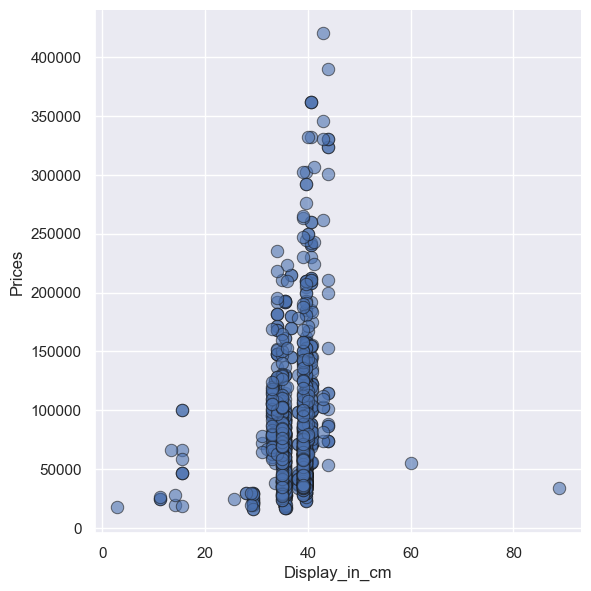

In [161]:
import seaborn as sns
#Linear plot for outliers
def lin_vis(num):
    
    len_num=len(num)
    qu=round(len_num/3)
    re=round(len_num%3)
    
    i=0
    j=3
    for itr in range(qu):
        sns.pairplot(data=df,x_vars=num[i:j],y_vars='Prices',palette='Dark2', plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},size=6)
        i=i+3
        j=j+3
    if re!=0:
        sns.pairplot(data=df,x_vars=num[i:],y_vars='Prices',palette='Dark2', plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},size=6)
#Get Continous columns 
def continous(df):
    num=df.select_dtypes(exclude='object')
    num=num.columns    
    num=num.to_list()
    num.pop()
    con=[]
    for itr in num:
        if df[itr].nunique()>20:
            con.append(itr)
    return con
sns.set(rc={'figure.figsize':(120,40)})
con=continous(df2)
lin_vis(con)

<div  style="border: 1px solid black; border-collapse: collapse;"><b>Prices</b></div>

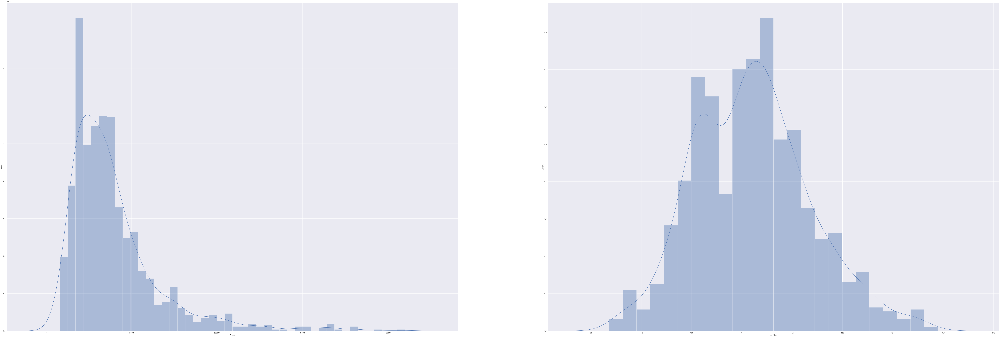

In [162]:
fig,ax=plt.subplots(ncols=2)
y_=df1['Prices']
sns.distplot(y_,ax=ax[0])
y_log=np.log(df1['Prices'])
sns.distplot(y_log,ax=ax[1])
plt.xlabel("log Prices")
plt.show()

<b>All columns are numerical ✅ </b>

<div id='Statiscs' style="background-color: Yellow;border: 1px solid black; border-collapse: collapse;"><b>Statistics</b></div>

<div id="ANOVA" style="border: 2px solid yellow; border-collapse: collapse;"><b>1) ANOVA test</b></div>

Doing Anova test to see wheather the mean of each brand name is same or not
* h0:-mean of all the brand name is the same
* h1:- mean of all the bran name is not the same

In [163]:
from statsmodels.formula.api import ols
import statsmodels.api as sm
new=ols('Prices ~ brand_name',data=df1).fit()
an=sm.stats.anova_lm(new,typ=2)
an

,sum_sq,df,F,PR(>F)
brand_name,4.024087e+11,1.0,155.076136,7.764511e-34
Residual,3.632875e+12,1400.0,NaN,NaN


<pre>
<div style='color:red;'><b>Note:-</b></div>
<b>P value</b> :-7.764511e-34 ie 0.00000000000007 as the p value is less than 0.05 so we accept the  strongly alternate hypothesis
* ie the mean of all the brand names are totally different
</pre>

<div id='Seprate' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 9:-Seprate and X and Y columns</b></div>

In [164]:
x=df1.drop('Prices',axis=1)
y=df1['Prices']

In [165]:
x.head()

,brand_name,Memmory,Basic_Operating_System,RAM,Processor_name,Display_in_cm
0,10.0,0.0,3,1.0,11,39.6
1,3.0,1.0,3,5.0,6,39.6
2,7.0,1.0,3,3.0,6,35.5
3,7.0,0.0,3,0.0,6,39.6
4,5.0,1.0,3,0.0,6,39.6


In [166]:
y.head()

0    57990.0
1    32990.0
2    42290.0
3    43900.0
4    33900.0
Name: Prices, dtype: float64

<div id="knn" style="border: 1px solid black; border-collapse: collapse;"><b>D)Fill the Missing values with KNN Imputer</b></div>

In [167]:
from sklearn.impute import KNNImputer
#Filling the columns with m
imputer = KNNImputer(n_neighbors=2)
x = imputer.fit_transform(x)
x

array([[10. ,  0. ,  3. ,  1. , 11. , 39.6],
       [ 3. ,  1. ,  3. ,  5. ,  6. , 39.6],
       [ 7. ,  1. ,  3. ,  3. ,  6. , 35.5],
       ...,
       [ 7. ,  0. ,  3. ,  1. ,  8. , 35. ],
       [ 7. ,  0. ,  3. ,  0. ,  8. , 35. ],
       [ 7. ,  0. ,  3. ,  0. ,  8. , 35. ]])

<div id='Scaling' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 10:-Scaling the Data & taking log of y</b></div>

In [168]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = scaler.fit_transform(x)

In [169]:
from pickle import dump
dump(scaler, open('scaler.pkl', 'wb'))

In [170]:
y=np.log(y)

<div id='PCA' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 11:-Feature Selection-PCA,RFE</b></div>

In [171]:
# Applying PCA function on training
# and testing set of X component
from sklearn.decomposition import PCA

pca = PCA()

x= pca.fit_transform(x)

explained_variance = pca.explained_variance_ratio_

print(explained_variance)

[0.29299924 0.24270217 0.15378684 0.11677405 0.10071996 0.09301774]


In [172]:
from sklearn.feature_selection import RFE
from sklearn.neighbors import KNeighborsRegressor 
#Create a KNN Model
model_KNN=KNeighborsRegressor()
# Trying Feature selection-RFE
selector = RFE(model_KNN, n_features_to_select=8, step=1)
selector = selector.fit(x, y)
filter1 = selector.support_
ranking = selector.ranking_
print("Mask data: ", filter1)
print("Ranking: ", ranking) 

Mask data:  [ True  True  True  True  True  True]
Ranking:  [1 1 1 1 1 1]


<div id='Train' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 12:-Train-Test split</b></div>

In [173]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y,test_size=.20,random_state =123)

In [174]:
# from sklearn.model_selection import StratifiedShuffleSplit
# # use StratifiedShuffleSplit()
# sss = StratifiedShuffleSplit(n_splits=4, test_size=0.2,
# 							random_state=0)
# sss.get_n_splits(y, y)
# for train_index, test_index in sss.split(x, y):
#     X_train, X_test = X[train_index], X[test_index]
#     Y_train, y_test = y[train_index], y[test_index]

<div id='Model' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 13:-Model Training and testing</b></div>

<div style="border: 1px solid black; border-collapse: collapse;"><b>A)Lazy Regressor</b></div>

In [175]:
import lazypredict
from lazypredict.Supervised import LazyRegressor

clf = LazyRegressor(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 42/42 [00:38<00:00,  1.08it/s]

                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
XGBRegressor                                 0.89       0.89  0.18        0.14
ExtraTreesRegressor                          0.89       0.89  0.18        0.22
GradientBoostingRegressor                    0.87       0.88  0.19        0.16
NuSVR                                        0.86       0.87  0.19        0.11
SVR                                          0.86       0.87  0.19        0.10
HistGradientBoostingRegressor                0.86       0.86  0.20        0.37
RandomForestRegressor                        0.85       0.86  0.20        0.47
BaggingRegressor                             0.85       0.85  0.21        0.06
LGBMRegressor                                0.85       0.85  0.21        0.16
KNeighborsRegressor                          0.82       0.82  0.22        0.01
DecisionTreeRegressor                        0.79   

<div style="border: 1px solid black; border-collapse: collapse;"><b>Model 1:-KNN(K-nearest neighbour)</b></div>

<div style="border: 1px solid red; border-collapse: collapse;"><b>A)Create a KNN Model</b></div>

In [176]:
from sklearn.neighbors import KNeighborsRegressor 


#Create a KNN Model
model_KNN=KNeighborsRegressor()
model_KNN.fit(X_train,y_train)
print("The base model :-",model_KNN.score(X_test,y_test))


The base model :- 0.8508727967808332


<div style="border: 1px solid red; border-collapse: collapse;"><b>B)Evaluating the Base model</b></div>

---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8508727967808332

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8508727967808332
RMSE: 0.20640277165071247
Adj R-square: 0.8502318489159943
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.52   0.02
1    950         11.93            11.95   0.01
2   1403         11.24            11.11   0.14
3    276         10.57            10.68   0.11
4    222         10.82            10.77   0.05


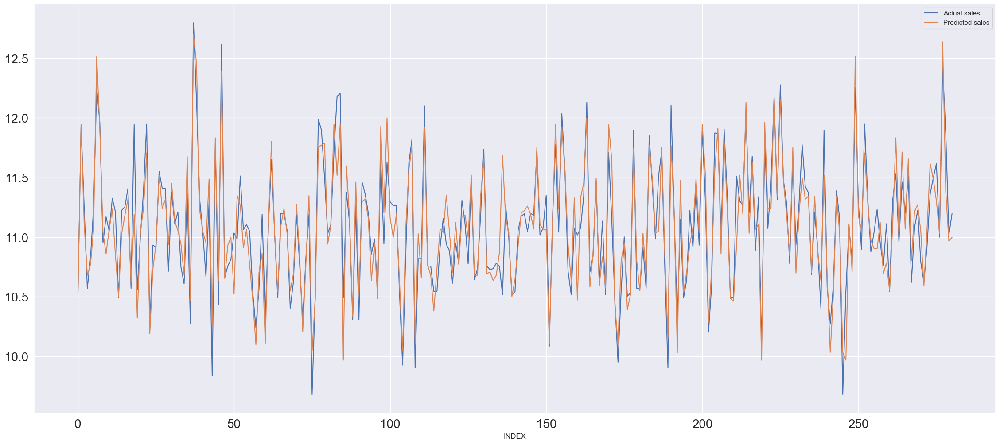

In [179]:
#Evaluating the Base model
from sklearn.metrics import r2_score,mean_squared_error
import numpy as np
from sklearn.feature_selection import RFE
from Evaluation import Evaluation
Evaluation1=Evaluation(X_test,y_test,x,y)
data=Evaluation1.regression(model_KNN)
Y_PRED=model_KNN.predict(X_test)
print(data)

<div style="border: 1px solid red; border-collapse: collapse;"><b>C)Hyper-Parameter Tunning</b></div>

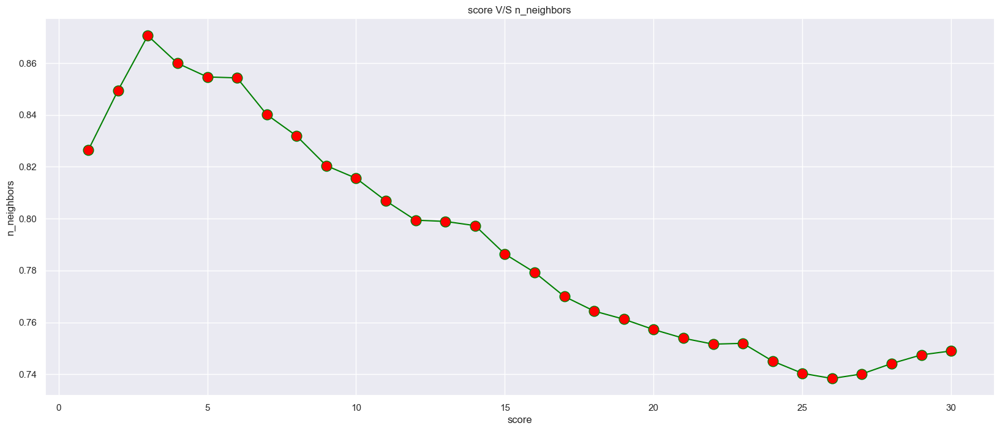

In [180]:
#Visualizing the n_neighbours parameter
knn=KNeighborsRegressor()
n_itr=[]
score=[]
for itr in range(1,31):
    knn=KNeighborsRegressor(n_neighbors=itr,metric='manhattan')
    knn.fit(X_train,y_train)
    n_itr.append(itr)
    score.append(knn.score(X_test,y_test))
plt.figure(figsize=(20,8))
plt.plot(n_itr, score, color = 'green',
         linestyle = 'solid', marker = 'o',
         markerfacecolor = 'red', markersize = 12)
plt.xlabel("score")
plt.ylabel("n_neighbors")
plt.title('score V/S n_neighbors')
plt.show()

In [195]:
model_para={
  "n_neighbors":np.arange(1,30,1),
    "metric":['manhattan','euclidean', 'minkowski'],
    "leaf_size":np.arange(0,70,1)
}
knn=KNeighborsRegressor()

In [197]:
#Randomized Search cv:-x,y
from sklearn.model_selection import RandomizedSearchCV
random_search=RandomizedSearchCV(knn,model_para,n_iter=200,cv=8,n_jobs=-1,refit=True,scoring='r2',random_state=10)
random_search.fit(x, y)
print("Random search cv:-")
print(random_search.best_params_)

Random search cv:-
{'n_neighbors': 29, 'metric': 'manhattan', 'leaf_size': 53}


In [198]:
from sklearn.metrics import SCORERS
print(SCORERS.keys())

dict_keys(['explained_variance', 'r2', 'max_error', 'matthews_corrcoef', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'top_k_accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_s

In [199]:
#Updated grid search on the baisis of random search cv results
model_para={
  "n_neighbors":np.arange(1,30,1),
    "metric":['manhattan',],
    "leaf_size":np.arange(40,90,1)
}
knn=KNeighborsRegressor()

In [200]:
#Performing gridsearch cv
from sklearn.model_selection import GridSearchCV
gridsearch = GridSearchCV(knn, model_para, cv=8,n_jobs=-1)
gridsearch.fit(x, y)
print("Grid search cv best parameters:-")
print(gridsearch.best_params_)
print()
print()
print()
print(gridsearch.cv_results_)

Grid search cv best parameters:-
{'leaf_size': 40, 'metric': 'manhattan', 'n_neighbors': 3}



{'mean_fit_time': array([0.00139564, 0.00144315, 0.00105   , ..., 0.00186911, 0.00105947,
       0.00137028]), 'std_fit_time': array([0.00046802, 0.00052286, 0.00051788, ..., 0.00160974, 0.0003882 ,
       0.00048274]), 'mean_score_time': array([0.002114  , 0.00195175, 0.00213245, ..., 0.00716621, 0.00474089,
       0.00548163]), 'std_score_time': array([0.00091438, 0.00049151, 0.00068319, ..., 0.00691975, 0.00035094,
       0.00049838]), 'param_leaf_size': masked_array(data=[40, 40, 40, ..., 89, 89, 89],
             mask=[False, False, False, ..., False, False, False],
       fill_value='?',
            dtype=object), 'param_metric': masked_array(data=['manhattan', 'manhattan', 'manhattan', ...,
                   'manhattan', 'manhattan', 'manhattan'],
             mask=[False, False, False, ..., False, False, False],
       fill_value='?',
            dtype=object), 'param_n_neighbors': m

In [201]:
#Take a look at the ggrid search cv results parameters
pd.set_option('max_colwidth', 500)
df_=pd.DataFrame(gridsearch.cv_results_)
df_.dropna(axis=0,inplace=True)
df_=df_[['params','mean_test_score']]
df_

,params,mean_test_score
0,"{'leaf_size': 40, 'metric': 'manhattan', 'n_neighbors': 1}",0.78
1,"{'leaf_size': 40, 'metric': 'manhattan', 'n_neighbors': 2}",0.81
2,"{'leaf_size': 40, 'metric': 'manhattan', 'n_neighbors': 3}",0.82
3,"{'leaf_size': 40, 'metric': 'manhattan', 'n_neighbors': 4}",0.81
4,"{'leaf_size': 40, 'metric': 'manhattan', 'n_neighbors': 5}",0.81
...,...,...
1445,"{'leaf_size': 89, 'metric': 'manhattan', 'n_neighbors': 25}",0.78
1446,"{'leaf_size': 89, 'metric': 'manhattan', 'n_neighbors': 26}",0.78
1447,"{'leaf_size': 89, 'metric': 'manhattan', 'n_neighbors': 27}",0.78
1448,"{'leaf_size': 89, 'metric': 'manhattan', 'n_neighbors': 28}",0.77


<div style="border: 1px solid red; border-collapse: collapse;"><b>D)Best Model after Hyper parameter tunning for knn</b></div>

In [202]:
model_KNN=KNeighborsRegressor(leaf_size= 40, metric= 'manhattan', n_neighbors=10)
model_KNN.fit(X_train,y_train)
print("Tunned model parameters :-",model_KNN.score(X_test,y_test))

Tunned model parameters :- 0.8147364446846747


---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8147364446846747

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8147364446846747
RMSE: 0.23005521654448718
Adj R-square: 0.8139401829856117
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.68   0.14
1    950         11.93            11.90   0.04
2   1403         11.24            11.17   0.08
3    276         10.57            10.65   0.08
4    222         10.82            10.88   0.06


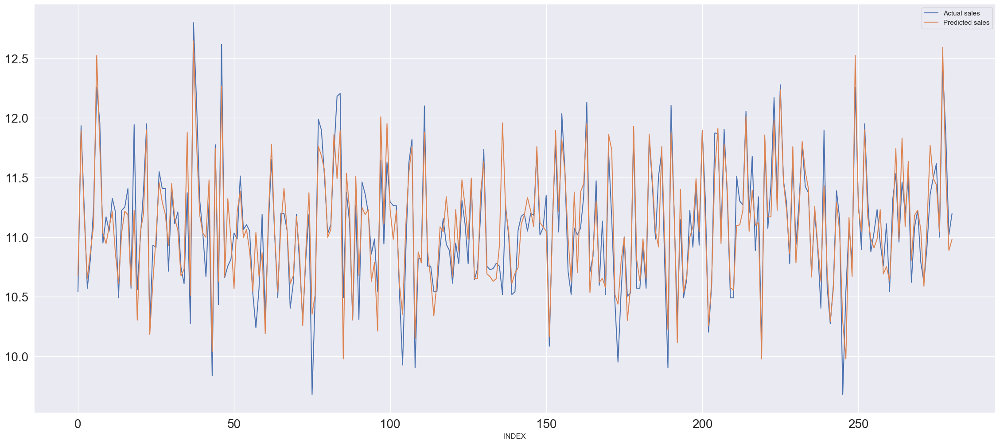

In [203]:
data=Evaluation1.regression(model_KNN)
Y_PRED=model_KNN.predict(X_test)
print(data)

<div style="border: 1px solid red; border-collapse: collapse;"><b>E)K-Fold cross validation</b></div>

In [204]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
model_KNN=KNeighborsRegressor(leaf_size= 56, metric= 'manhattan', n_neighbors=3)
kf = KFold(n_splits=5, random_state=None)

result = cross_val_score(model_KNN , X_train, y_train, cv = 25)
 
print("Avg accuracy: {}".format(result.mean()))
print("Score of the model:- ",result)

Avg accuracy: 0.8726076426239837
Score of the model:-  [0.9231745  0.93585592 0.94168164 0.85524264 0.93659991 0.89366018
 0.84616599 0.84626687 0.77727639 0.89063679 0.90274898 0.89570568
 0.73132318 0.85906445 0.87121546 0.87864305 0.94704356 0.88303659
 0.69584982 0.90481362 0.78710434 0.88885336 0.92269349 0.93279536
 0.86773931]


<div id='Functions' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 14:-Functions on Model Training</b></div>

In [205]:
from hyperopt import hp, fmin, tpe
from sklearn.model_selection import cross_val_score
from hyperopt import hp,fmin,tpe,STATUS_OK,Trials
# from bayes_opt import BayesianOptimization
class Main ():
    def __init__(self,x,y,X_train, X_test, y_train, y_test):
        
        self.x=x
        self.y=y
        self.X_train=X_train
        self.X_test=X_test
        self.y_train=y_train
        self.y_test=y_test
        
        
    #-----------------------------Model creation ------------------------------
    def Model_creation(self,model_obj,n_params=dict()):
        Evaluation_2=Evaluation(self.X_test,self.y_test,self.x,self.y)
        model_obj.set_params(**n_params)
        model_obj.fit(self.X_train,self.y_train)
        print(model_obj.score(self.X_test,self.y_test))
        data=Evaluation_2.regression(model_obj)
        Y_PRED=model_obj.predict(self.X_test)
        print(data)
        return model_obj
        
        
    #-----------------------Creating graphs for everry Parameters--------------------------------------
    def graphs(self,model_obj,params):
        
        count=0
        
        x=13.4
        y=15
        x_final=x*len(params)
        y_final=y*len(params)
        fig,ax=plt.subplots(len(params),figsize=(x_final,y_final))
        f=10*len(params)
        l=9.3*len(params)
        fin={}
        for x,y in params.items():
            n_itr=[]
            score=[]
            
            for itr in y:
                p={x:itr}
                model_obj.set_params(**p)
                model_obj.fit(self.X_train,self.y_train)
                score.append(model_obj.score(self.X_test,self.y_test))
            score_in=np.argmax(score)
            fin[x]=y[score_in]
            ax[count].plot(y, score, color = 'green',linestyle = 'solid', marker = 'o',
             markerfacecolor = 'red', markersize = 12)
            ax[count].set_xlabel(str(x),fontsize=f)
           
            ax[count].set_ylabel("Score",fontsize=f)
            ax[count].tick_params(labelsize=l)
            
            ax[count].set_title('Score V/S '+str(x),fontdict={"fontsize":34})
            count=count+1
        plt.tight_layout(pad=3)
        plt.show()
        print("Best Parameters:- ")
        return fin
    
    #--------------------------Hyper-parameter tunning-----------------------
    
    #---------------------------Random search -----------------------------------
    def Random_search(self,model_obj,n_params,itr=200):
        random_search=RandomizedSearchCV(model_obj,n_params,n_iter=itr,cv=5,n_jobs=-1,refit=True,scoring='r2')
        random_search.fit(X_train,y_train)
        params_=random_search.best_params_
        df_rand=pd.DataFrame(random_search.cv_results_)
        df_rand.dropna(axis=0,inplace=True)
        df_rand=df_rand[['params','mean_test_score']]
        print(df_rand.head(5))
        self.Model_creation(model_obj,params_)
        return random_search.best_params_
    
    
    #--------------------------------Grid search cv-----------------------------
    def Grid_search(self,model_obj,n_params):
        grid_search=GridSearchCV(model_obj,n_params,n_jobs=-1)
        grid_search.fit(X_train,y_train)
        params_=grid_search.best_params_
        df_grid=pd.DataFrame(grid_search.cv_results_)
        df_grid.dropna(axis=0,inplace=True)
        df_grid=df_grid[['params','mean_test_score']]
        print(df_grid.head(5))
        self.Model_creation(model_obj,params_)
        return grid_search.best_params_
    
    #---------------------------------Baysean search cv ----------------------------
    def space(self,n_params):
        space={}
        for x,y in params.items():
            space[x]=hp.choice(x,y)
        return space
    
    def objective(self,space):
        accuracy = cross_val_score(model_KNN, X_train, y_train, cv = 5).mean()
        # We aim to maximize accuracy, therefore we return it as a negative value
        return {'loss': -accuracy, 'status': STATUS_OK }
    
    def Baysean(self,model_obj,n_params):
        trials = Trials()
        space=self.space(n_params)
        best = fmin(fn= self.objective,
                    space= space,
                    algo= tpe.suggest,
                    max_evals = 15,
                    trials= trials)
        return best
    #---------------------------------------Main_Hyperparameters---------------------------
    def gr_(self,model_obj,graph):
        print("Press 1:-To get the old model object")
        print("Press 2: To get the modified model object after running the function")
        print("Press 3:To get the customizablle one")
        print("Press 4:-Exit")
        print()
        print()
        print("Press 1:- ")
        print(model_obj)
        gr={}
        for x,y in graph.items():
            
            if type(y) == str  :
                gr[x]=[y]
            else:
                y = y.item()
                gr[x]=np.arange(y-20,y+20,1)
                
        print("Press 2:-")
        print(gr)
        print("press 3:-Customize it .......")
        print()
        print()
        
        user_in=int(input("Enter a number:- "))
        if user_in==1:
            
            return model_obj
        elif user_in==2:
           
            return gr
        elif user_in==3:
            gr_co={}
            for x,y in graph.items():
                
                if type(y) == str:
                    ns=input("Enter"+x+"columns words space seprated:-")
                    ns=ns.split(" ")
                    gr_co[x]=[y]
                    
                else:
                    y = y.item()
                    nu=input("Enter "+x+"columns 3 numbers space seprated:-")
                    n=nu.split(" ")
                    gr_co[x]=np.arange(int(n[0]),int(n[1]),int(n[2]))
                    
            
            return gr_co
    def main(self,modelobj,params):
        print('--------------------------------------------Graph-----------------------------------------')
        graph=self.graphs(modelobj,params)
        print("Best Parsmeter Graph:-")
        print(graph)
        print()
        print()
        print("----------------------------------------Select a model object ------------------------------")
        grap=self.gr_(modelobj,graph)
        print()
        print()
        Random=self.Random_search(modelobj,grap)
        print("Best Parameter Random Search CV:- ")
        print(Random)
        print()
        grap1=self.gr_(modelobj,Random)
        print()
        print()
        Grid=self.Grid_search(modelobj,grap1)
        print("Best Parameter Grid Search CV:- ")
        print(Grid)
        
        

<div id='help' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 15:-Model Training with the help of Functions</b></div>

In [206]:
Base=Main(x,y,X_train, X_test, y_train, y_test)

0.8722157931933419
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8722157931933419

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8722157931933419
RMSE: 0.19106259811894497
Adj R-square: 0.8716665774047745
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.52   0.03
1    950         11.93            11.89   0.04
2   1403         11.24            11.05   0.19
3    276         10.57            10.67   0.10
4    222         10.82            10.85   0.03


KNeighborsRegressor(leaf_size=56, metric='manhattan', n_neighbors=3)

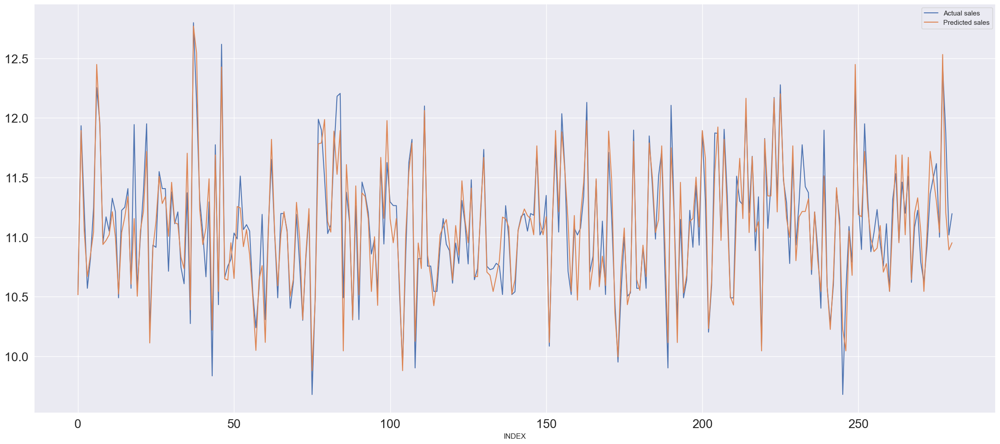

In [207]:
n_params={"leaf_size": 56, "metric": 'manhattan', "n_neighbors":3}
model_KNN=KNeighborsRegressor()
Base.Model_creation(model_KNN,n_params)

In [208]:
import sklearn
sklearn.neighbors.VALID_METRICS['brute']

['braycurtis',
 'canberra',
 'chebyshev',
 'cityblock',
 'correlation',
 'cosine',
 'dice',
 'euclidean',
 'hamming',
 'haversine',
 'jaccard',
 'kulsinski',
 'l1',
 'l2',
 'mahalanobis',
 'manhattan',
 'matching',
 'minkowski',
 'nan_euclidean',
 'precomputed',
 'rogerstanimoto',
 'russellrao',
 'seuclidean',
 'sokalmichener',
 'sokalsneath',
 'sqeuclidean',
 'yule']

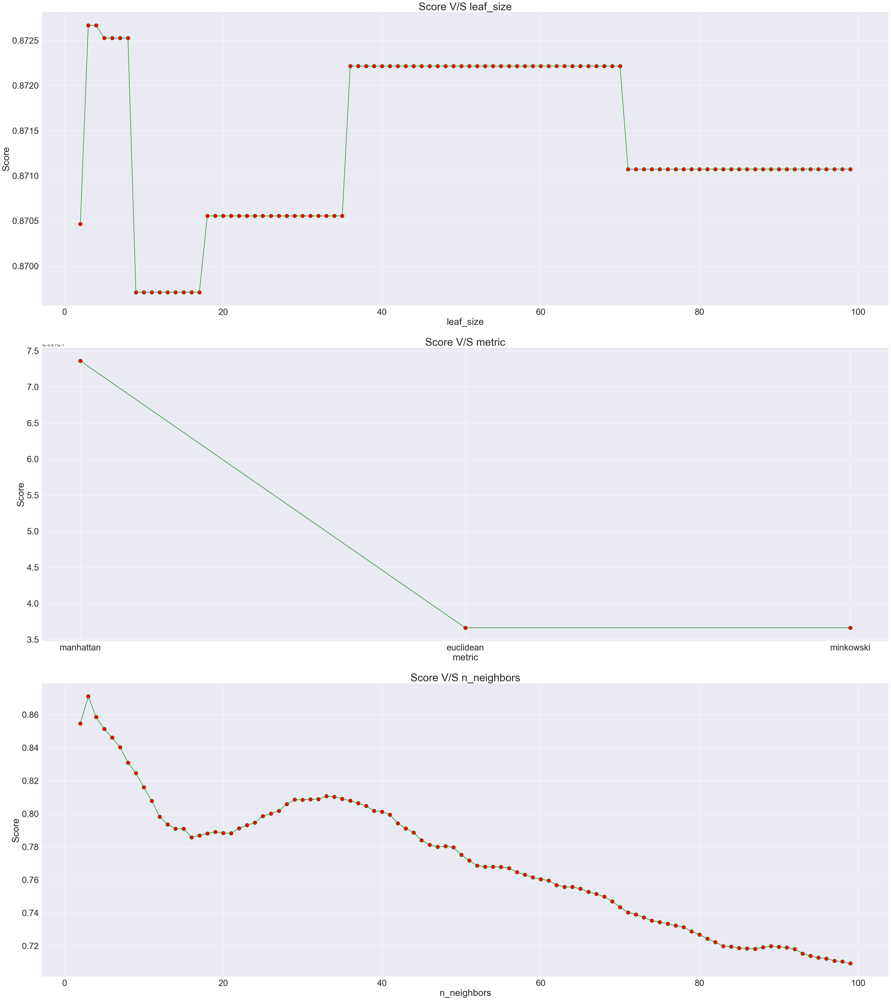

Best Parameters:- 
{'leaf_size': 3, 'metric': 'manhattan', 'n_neighbors': 3}


In [209]:
import numpy as np
params={
    "leaf_size":np.arange(2,100,1),
   "metric":['manhattan','euclidean', 'minkowski'],
    "n_neighbors":np.arange(2,100,1)
}
print(Base.graphs(model_KNN,params))

In [210]:
model_KNN=KNeighborsRegressor(leaf_size= 70, metric= 'euclidean', n_neighbors=2)
model_KNN.fit(X_train,y_train)
print("Tunned model parameters :-",model_KNN.score(X_test,y_test))

Tunned model parameters :- 0.8516009147646393


                                                        params  \
0   {'n_neighbors': 2, 'metric': 'euclidean', 'leaf_size': 50}   
1  {'n_neighbors': 25, 'metric': 'manhattan', 'leaf_size': 20}   
2  {'n_neighbors': 50, 'metric': 'minkowski', 'leaf_size': 21}   
3   {'n_neighbors': 57, 'metric': 'manhattan', 'leaf_size': 9}   
4  {'n_neighbors': 65, 'metric': 'minkowski', 'leaf_size': 32}   

   mean_test_score  
0             0.86  
1             0.81  
2             0.77  
3             0.74  
4             0.75  
0.8596381542904904
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8596381542904904

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8596381542904904
RMSE: 0.2002449735930378
Adj R-square: 0.8590348798819968
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.53   0.01
1    95

{'n_neighbors': 2, 'metric': 'manhattan', 'leaf_size': 86}

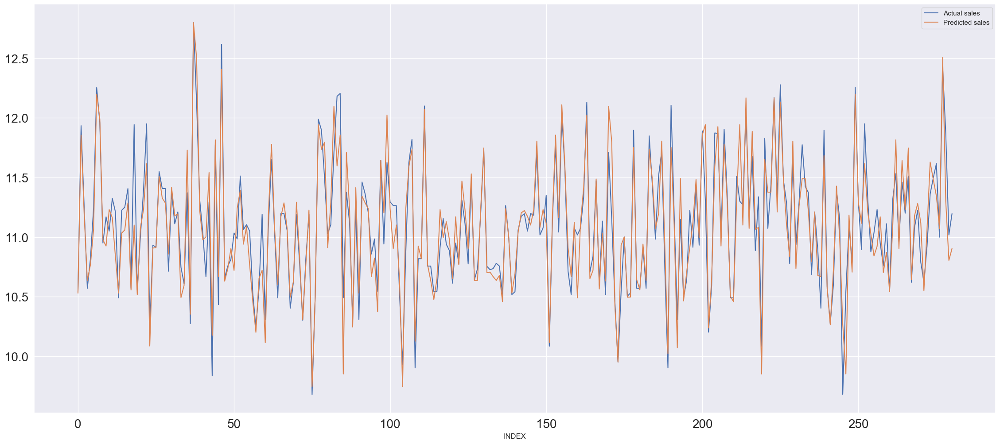

In [211]:
itr=500
params={
    "leaf_size":np.arange(2,100,1),
   "metric":['manhattan','euclidean', 'minkowski'],
    "n_neighbors":np.arange(2,100,1)
}
Base.Random_search(model_KNN,params,itr)


                                                        params  \
0   {'leaf_size': 60, 'metric': 'manhattan', 'n_neighbors': 6}   
1   {'leaf_size': 60, 'metric': 'manhattan', 'n_neighbors': 7}   
2   {'leaf_size': 60, 'metric': 'manhattan', 'n_neighbors': 8}   
3   {'leaf_size': 60, 'metric': 'manhattan', 'n_neighbors': 9}   
4  {'leaf_size': 60, 'metric': 'manhattan', 'n_neighbors': 10}   

   mean_test_score  
0             0.85  
1             0.85  
2             0.84  
3             0.85  
4             0.84  
0.8458578220825184
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8458578220825184

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8458578220825184
RMSE: 0.20984461738106755
Adj R-square: 0.8451953198851653
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.51   0.03
1    9

{'leaf_size': 60, 'metric': 'euclidean', 'n_neighbors': 6}

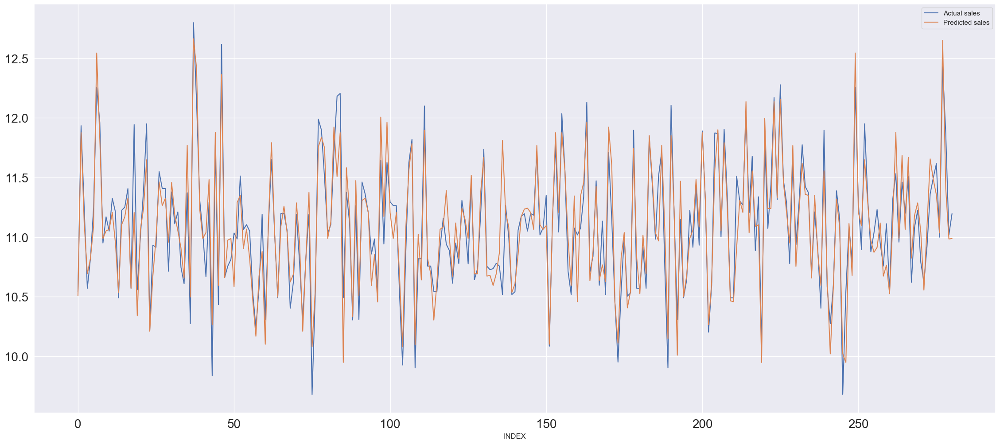

In [212]:
params={
    "leaf_size":np.arange(60,70,1),
   "metric":['manhattan','euclidean', 'minkowski'],
    "n_neighbors":np.arange(6,16,1)
}
Base.Grid_search(model_KNN,params)

In [213]:
Base.Baysean(model_KNN,params)

100%|███████████████████████████████████████████████| 15/15 [00:00<00:00, 52.80trial/s, best loss: -0.8544178862919279]


{'leaf_size': 2, 'metric': 2, 'n_neighbors': 1}

In [214]:
# Base.main(model_KNN,params)

<div id='Model_' style="background-color: powderblue;border: 1px solid black; border-collapse: collapse;"><b>Step 16:-Model Training </b></div>

<div style="border: 4px solid yellow; border-collapse: collapse;border-style: dotted;"><b>A)Linear Regression</b></div>

In [215]:
from sklearn.linear_model import LinearRegression
import seaborn as sns

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>Check Linearity</b></div>

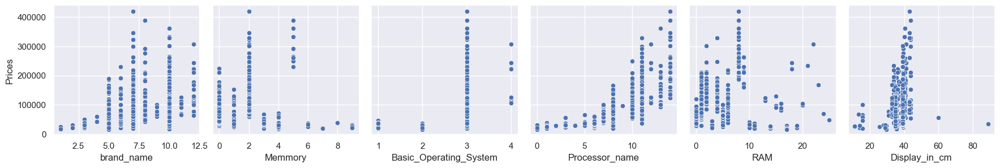

In [216]:
sns.pairplot(df1, x_vars=['brand_name','Memmory','Basic_Operating_System','Processor_name','RAM','Display_in_cm'], y_vars=['Prices'],size=3)
plt.show()

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>Check Normality</b></div>

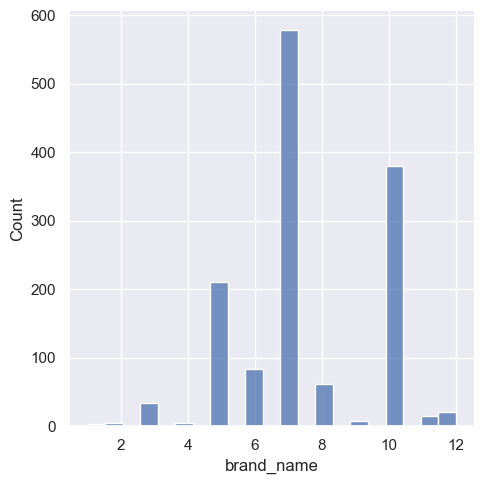

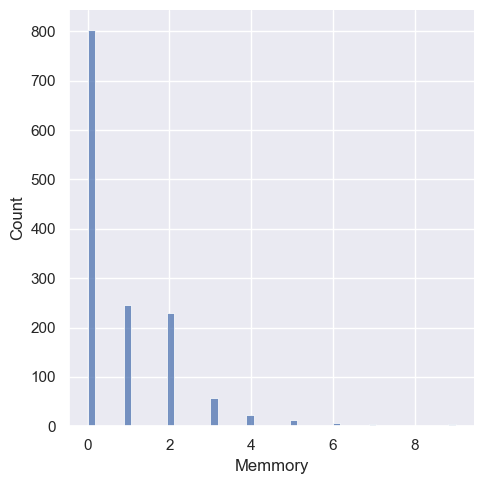

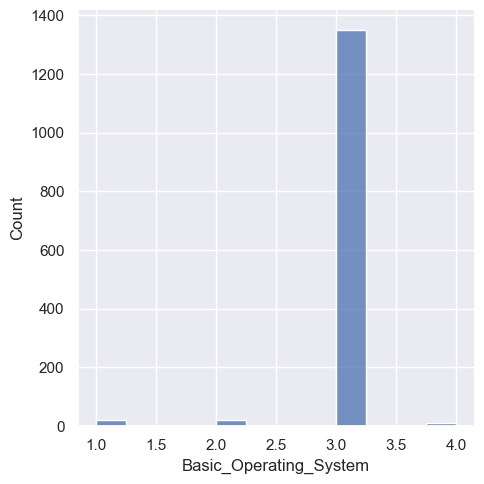

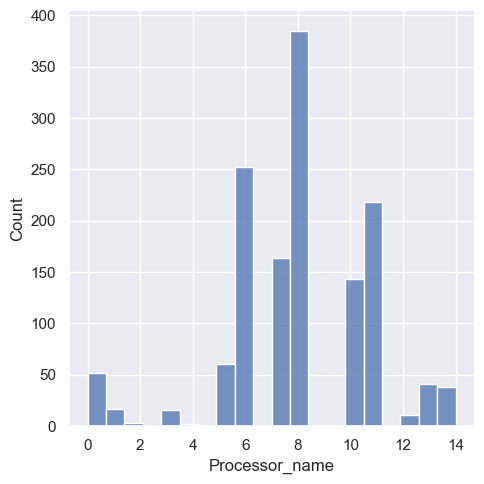

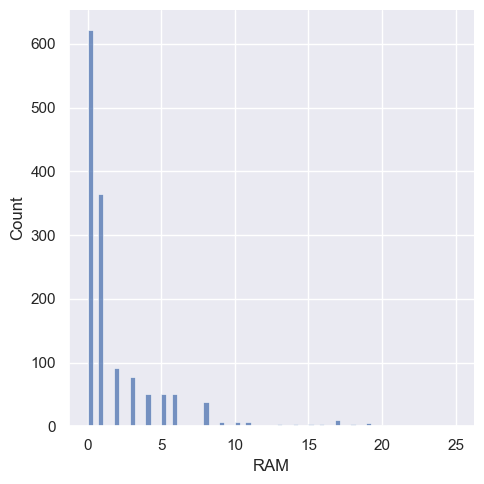

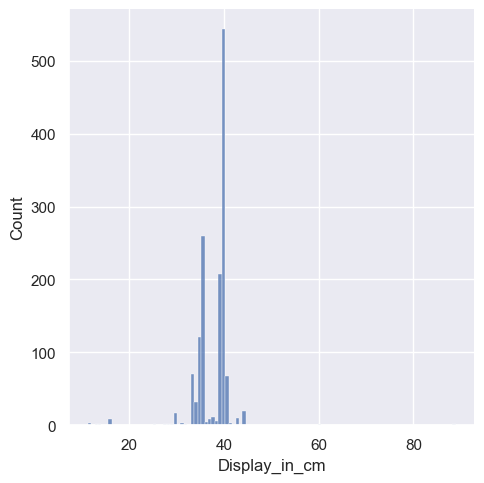

In [217]:
x_vars=['brand_name','Memmory','Basic_Operating_System','Processor_name','RAM','Display_in_cm']
for itr in x_vars:
    sns.displot(x=df1[itr])
    

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>Check Outliers</b></div>

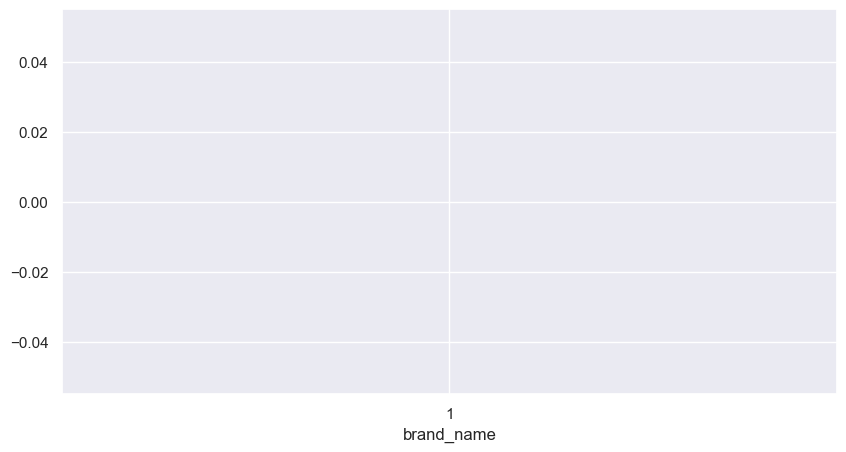

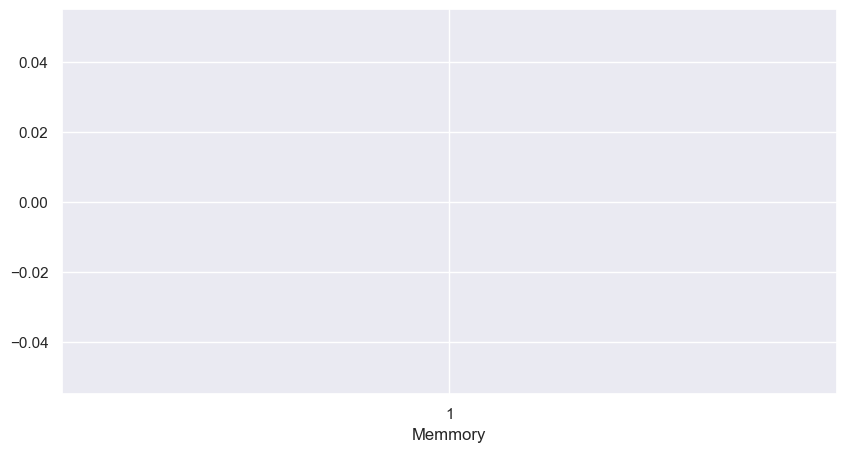

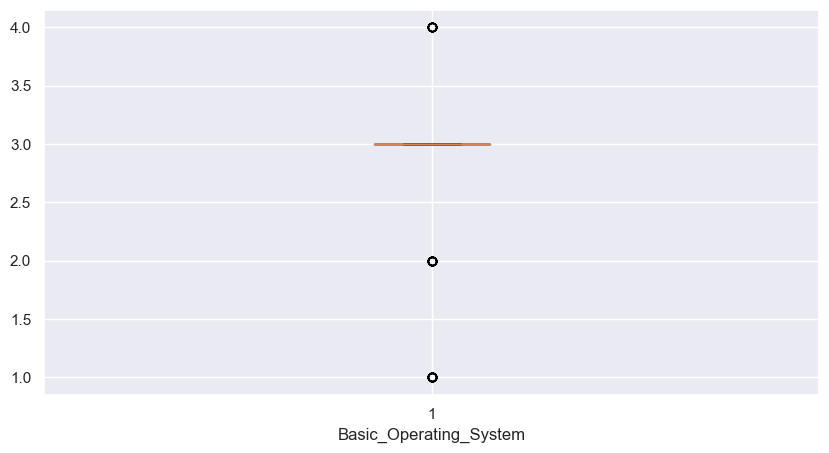

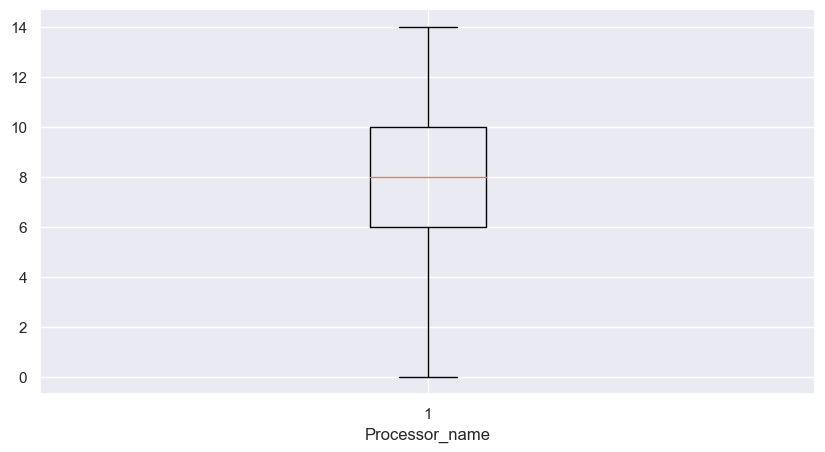

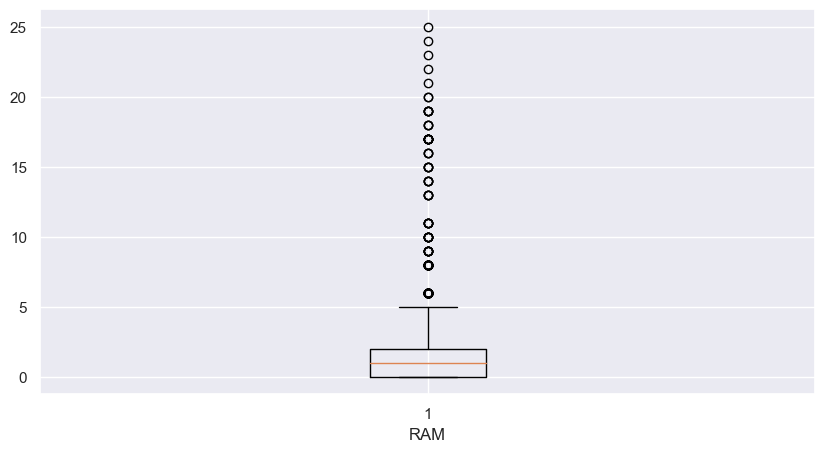

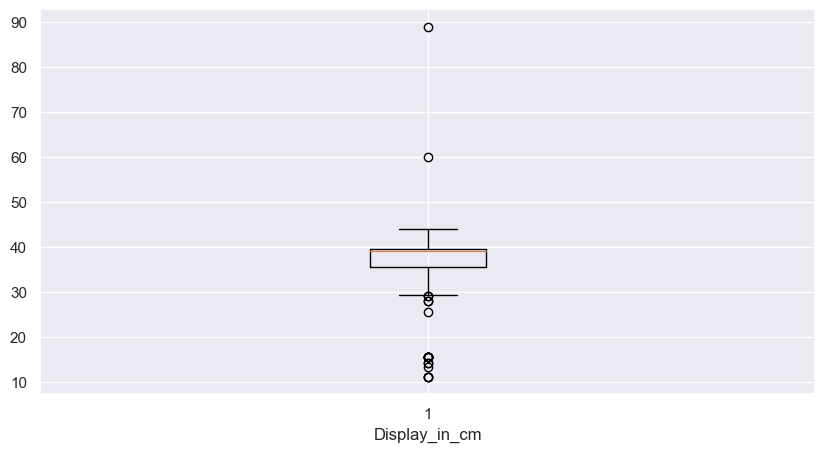

In [218]:
sns.set(rc={'figure.figsize':(10,5)})
for itr in x_vars:
    plt.boxplot(x=df1[itr])
    plt.xlabel(itr)
    plt.show()

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>Linear model</b></div>

0.7245286735035374
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.7245286735035374

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.7245286735035374
RMSE: 0.2805274012364855
Adj R-square: 0.7233446993208879
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.80   0.26
1    950         11.93            11.99   0.05
2   1403         11.24            11.01   0.23
3    276         10.57            10.75   0.18
4    222         10.82            11.13   0.31


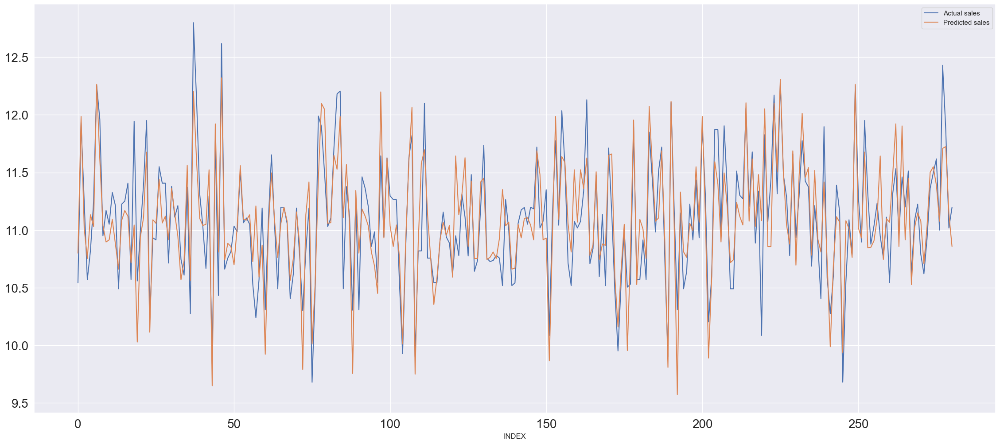

In [219]:
from sklearn.pipeline import Pipeline # For setting up pipeline
model=LinearRegression()
# created model
# Base=Base(x,y,X_train, X_test, y_train, y_test)
linear=Base.Model_creation(model)

In [220]:
df_lin=pd.DataFrame(zip(df1.columns,linear.coef_),columns=['Column name','values'])
df_lin

,Column name,values
0,brand_name,-0.16
1,Memmory,0.32
2,Basic_Operating_System,0.04
3,RAM,0.25
4,Processor_name,-0.20
5,Display_in_cm,-0.01


<div style="border: 2px solid yellow; border-collapse: collapse;"><b>Create a second Linear model-Filtered one using Pipeline</b></div>

In [221]:
x_=df1.loc[:,["brand_name",'Memmory','Basic_Operating_System','RAM',"Processor_name"]]
y_=df1['Prices']
imputer = KNNImputer(n_neighbors=2)
x_ = imputer.fit_transform(x_)
x_

array([[10.,  0.,  3.,  1., 11.],
       [ 3.,  1.,  3.,  5.,  6.],
       [ 7.,  1.,  3.,  3.,  6.],
       ...,
       [ 7.,  0.,  3.,  1.,  8.],
       [ 7.,  0.,  3.,  0.,  8.],
       [ 7.,  0.,  3.,  0.,  8.]])

In [222]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_ = scaler.fit_transform(x_)
y_=np.log(y_)


--------------------------------------- LinearRegression() ----------------------------------------

0.7288628942107482
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.7288628942107482

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.7288628942107482
RMSE: 0.2783117654918628
Adj R-square: 0.7278924679194481
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.76   0.22
1    950         11.93            11.97   0.04
2   1403         11.24            11.06   0.19
3    276         10.57            10.73   0.16
4    222         10.82            11.12   0.30
LinearRegression()

--------------------------------------- Lasso() ----------------------------------------

-0.0006855897999897831
---------------------------------------- SCORE ------------------------------------------------

The Score 

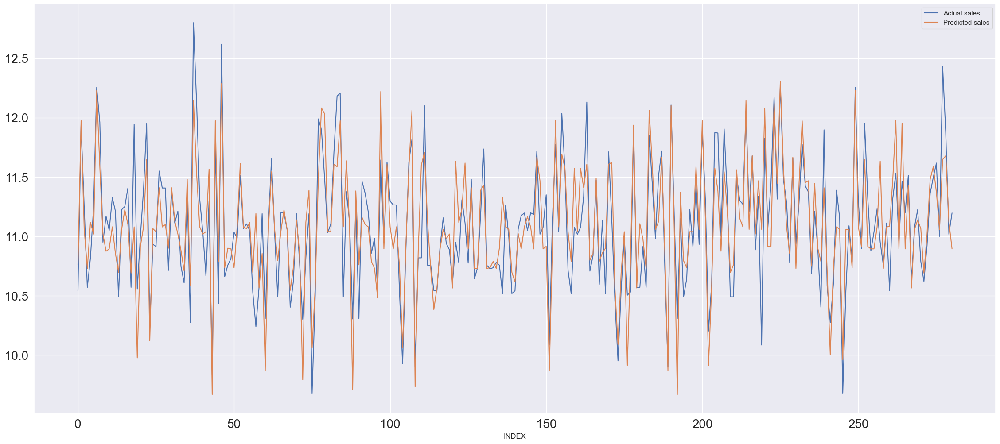

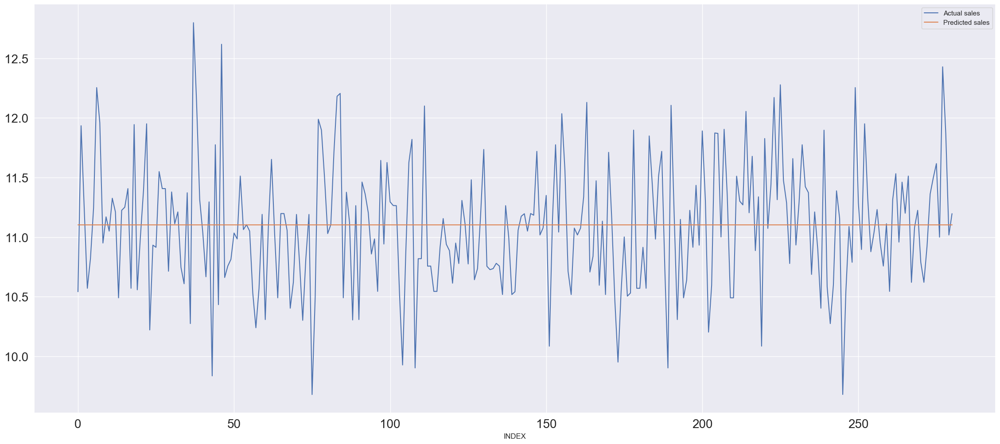

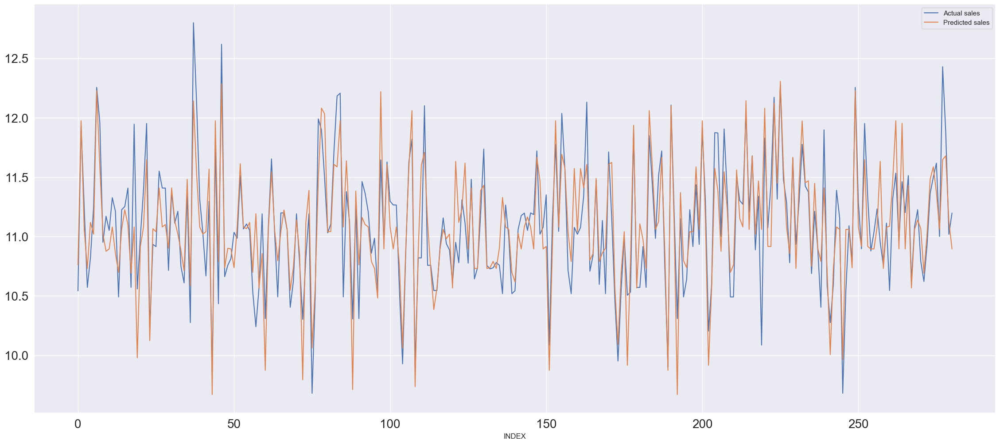

In [223]:
from sklearn.linear_model import Lasso,Ridge
from sklearn.pipeline import Pipeline

X_train_, X_test_, y_train_, y_test_ = train_test_split(x_, y_,test_size=.20,random_state =123)

# Create the steps to be performed
steps = [
    ('LR', LinearRegression()),
    ("Lasso",Lasso()),
    ("Ridge",Ridge())]


pipe = Pipeline(steps)
Base_1_=Main(x_,y_,X_train_, X_test_, y_train_, y_test_)

# Fit the pipeline
for itr in pipe:
    print()
    print("---------------------------------------",itr,"----------------------------------------")
    print()
    s=Base_1_.Model_creation(itr)
    print(s)    

<div style="border: 2px solid yellow; border-collapse: collapse;"><b> Mean of Residuals</b></div>

In [224]:
y_pred_=s.predict(X_test_)
res=y_pred_-y_test_
mean_residuals = np.mean(res)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 0.0027850797760306818


<div style="border: 2px solid yellow; border-collapse: collapse;"><b>K-Fold Cross validation</b></div>

In [225]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
model_LR=LinearRegression()
kf = KFold(n_splits=5, random_state=None)

result = cross_val_score(model_LR ,x_ ,y_ , cv = 25)
print("Avg accuracy: {}".format(result.mean()))
print("Score of the model:- ",result)

Avg accuracy: 0.694158732086407
Score of the model:-  [0.72475411 0.84219455 0.69429385 0.76462052 0.77727815 0.81803664
 0.69184128 0.74586885 0.73861886 0.70766356 0.82736723 0.81432757
 0.48736205 0.79993882 0.73795866 0.49067903 0.56183257 0.68830957
 0.2113991  0.73727021 0.57439931 0.76103335 0.74461861 0.66087913
 0.75142273]


<div style="border: 4px solid yellow; border-collapse: collapse;border-style: dotted;"><b>B)Decision Tree</b></div>

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>A)Base Model</b></div>

0.8114406082286705
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8114406082286705

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8114406082286705
RMSE: 0.23209253530895055
Adj R-square: 0.8106301810434069
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.54   0.00
1    950         11.93            11.95   0.01
2   1403         11.24            11.11   0.13
3    276         10.57            10.66   0.09
4    222         10.82            10.80   0.02


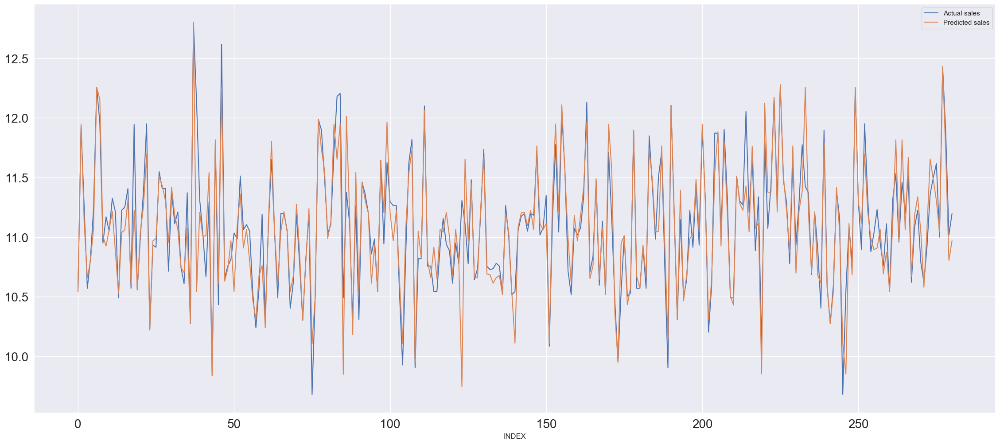

In [226]:
from sklearn.tree import DecisionTreeRegressor
base=DecisionTreeRegressor(random_state=10)
Decision=Main(x,y,X_train, X_test, y_train, y_test)
DTmodel=Decision.Model_creation(base)

In [227]:
from sklearn.tree import DecisionTreeRegressor
base=DecisionTreeRegressor(random_state=10)
base.fit(X_train,y_train)
base.score(X_test,y_test)

0.8114406082286705

<b>Note</b>:-It is important to pass the random state parameter or everytime you run it the algorithium will take a different split

In [228]:
importances = DTmodel.feature_importances_
df_DT=pd.DataFrame(zip(df1.columns,importances),columns=['Column name','values'])
df_DT

,Column name,values
0,brand_name,0.15
1,Memmory,0.36
2,Basic_Operating_System,0.08
3,RAM,0.07
4,Processor_name,0.29
5,Display_in_cm,0.05


<b>Note</b>:-As we can see all the features have a good amount of feature importance when it comes to Decision Tree

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>B)Prunning the Tree</b></div>

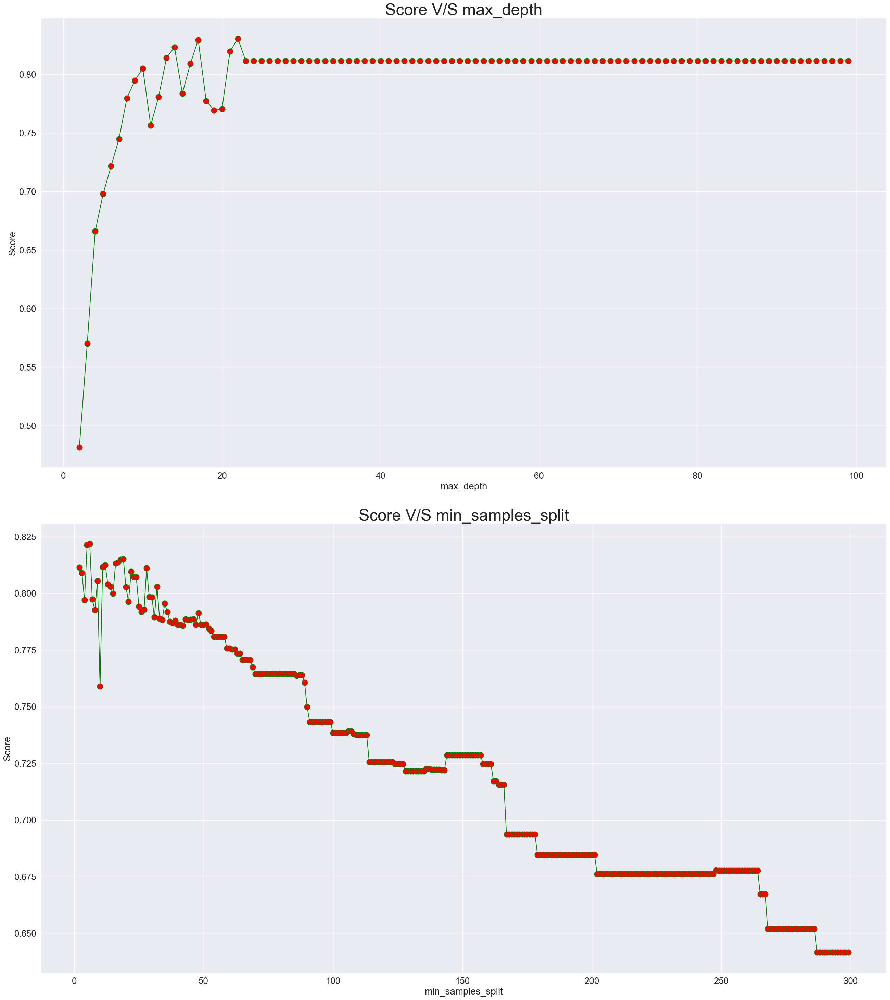

Best Parameters:- 
{'max_depth': 22, 'min_samples_split': 6}


In [229]:
import numpy as np
params={
    "max_depth":np.arange(2,100,1),
 "min_samples_split":np.arange(2,300,1)}
print(Decision.graphs(DTmodel,params))

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>C)K-Fold cross validation</b></div>

In [230]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
model_DT=DecisionTreeRegressor(max_depth=27,random_state=10)
kf = KFold(n_splits=5, shuffle=False)

result = cross_val_score(model_DT ,x ,y , cv = 25)
 
print("Avg accuracy: {}".format(result.mean()))
print("Score of the model:- ",result)

Avg accuracy: 0.7604186556041719
Score of the model:-  [ 0.87850501  0.84682848  0.76289129  0.88714998  0.93567624  0.9780074
  0.93665191  0.74378245  0.92029241  0.65766318  0.91721498  0.88474274
  0.76612573  0.81575436  0.84461711  0.65812322  0.66982102  0.87266783
 -0.16585556  0.55226827  0.58417163  0.74123846  0.7386903   0.75961247
  0.82382548]


<div style="border: 4px solid yellow; border-collapse: collapse;border-style: dotted;"><b>C)ExtraTree Regressor</b></div>

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>A)Base Model</b></div>

0.8951436650424324
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8951436650424324

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8951436650424324
RMSE: 0.17307503384757458
Adj R-square: 0.8946929931156806
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.54   0.00
1    950         11.93            11.95   0.01
2   1403         11.24            11.11   0.13
3    276         10.57            10.66   0.09
4    222         10.82            10.80   0.02


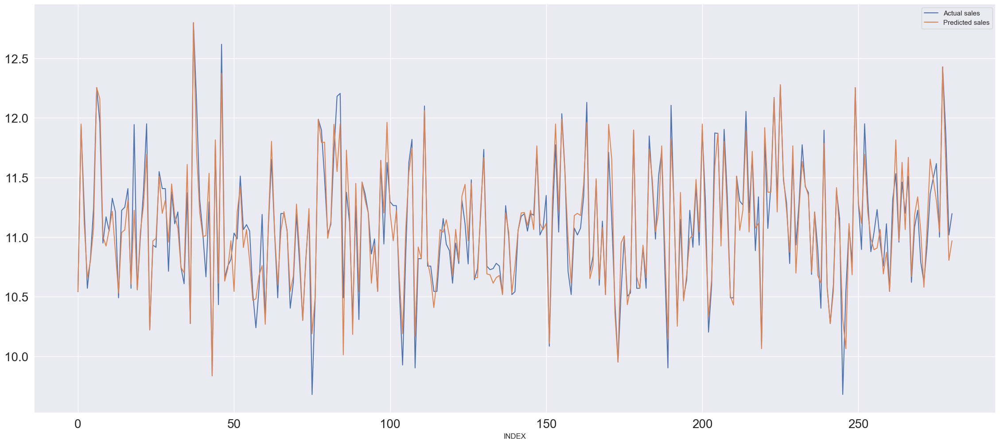

In [231]:
from sklearn.ensemble import ExtraTreesRegressor
base_ex=ExtraTreesRegressor(random_state=123)
ExtraTree=Main(x,y,X_train, X_test, y_train, y_test)
base_Extra=ExtraTree.Model_creation(base_ex)

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>B)Prunning the Tree</b></div>

In [232]:
# params={
#     "n_estimators":np.arange(2,300,3),
#  "max_depth":np.arange(2,300,1)}
# print(ExtraTree.graphs(base_ex,params))

In [233]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
model_DT=ExtraTreesRegressor(n_estimators=5,max_depth=27,random_state=10)
# kf = KFold(n_splits=5, shuffle=False)

result = cross_val_score(model_DT ,x ,y , cv = 25)
 
print("Avg accuracy: {}".format(result.mean()))
print("Score of the model:- ",result)

Avg accuracy: 0.8420111355796547
Score of the model:-  [0.91477337 0.9131135  0.8478169  0.96368244 0.9382912  0.97478977
 0.93618343 0.97663363 0.81274973 0.90488212 0.92411109 0.90046638
 0.67895094 0.90328954 0.86952334 0.7505601  0.73190233 0.86103277
 0.36166145 0.84914793 0.70815593 0.87504797 0.75687899 0.84950506
 0.84712851]


In [234]:
model_DT=ExtraTreesRegressor(n_estimators=53,max_depth=27,random_state=10)
result = cross_val_score(model_DT ,x ,y , cv = 25)
 
print("Avg accuracy: {}".format(result.mean()))


Avg accuracy: 0.8623587325895444


In [235]:
model_DT=ExtraTreesRegressor(n_estimators=150,max_depth=27,random_state=10)
result = cross_val_score(model_DT ,x ,y , cv = 25)
 
print("Avg accuracy: {}".format(result.mean()))
print("Score of the model:- ",result)

Avg accuracy: 0.8641902547696242
Score of the model:-  [0.91061145 0.91952118 0.87204986 0.96385476 0.94754937 0.97790914
 0.93498435 0.97459931 0.90684986 0.91726276 0.92145146 0.90957053
 0.74956607 0.92219652 0.8477128  0.73626936 0.78919339 0.91120114
 0.58071369 0.83048927 0.72532442 0.88109656 0.75485798 0.85364271
 0.86627844]


In [236]:
# base_ex=ExtraTreesRegressor(n_estimators=150,random_state=10)
# params={
#     "min_samples_split":np.arange(2,100,1),
#  "max_depth":np.arange(1,300,1)}
# print(ExtraTree.graphs(base_ex,params))

In [237]:
base_ex=ExtraTreesRegressor(n_estimators=150,random_state=10,max_depth=16)

kf = KFold(n_splits=5, shuffle=False)

result = cross_val_score(base_ex ,x ,y , cv = 25)
 
print("Avg accuracy: {}".format(result.mean()))
print("Score of the model:- ",result)

Avg accuracy: 0.8651671244156259
Score of the model:-  [0.90378262 0.91927976 0.87715351 0.96386299 0.94649388 0.97752704
 0.93550224 0.97592449 0.90664614 0.91572737 0.92328527 0.91270686
 0.75330971 0.92231697 0.81920277 0.72378106 0.80572987 0.91226912
 0.58598493 0.83983859 0.72922832 0.87344231 0.78005942 0.85558506
 0.8705378 ]


<div style="border: 4px solid yellow; border-collapse: collapse;border-style: dotted;"><b>C) RandomForestRegressor</b></div>

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>A)Base RandomForestRegressor Model</b></div>

0.8666803576256102
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8666803576256102

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8666803576256102
RMSE: 0.1951570112036125
Adj R-square: 0.8661073505666945
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.53   0.01
1    950         11.93            11.96   0.03
2   1403         11.24            11.13   0.12
3    276         10.57            10.66   0.09
4    222         10.82            10.80   0.02


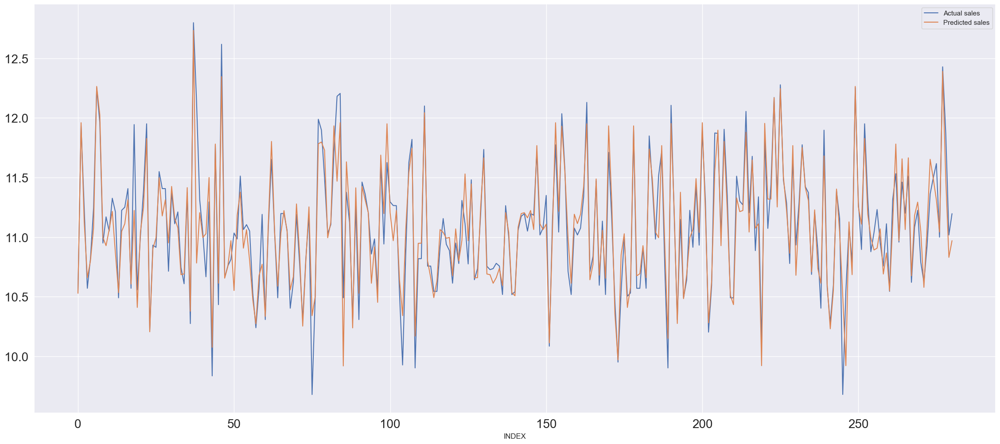

In [238]:
from sklearn.ensemble import RandomForestRegressor
Random_Fore=RandomForestRegressor(n_estimators=150,random_state=100,max_depth=17)
Random=Main(x,y,X_train, X_test, y_train, y_test)
base_Extra=ExtraTree.Model_creation(Random_Fore)

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>B)K-fold cross validation Model</b></div>

In [239]:
Random_Fore=RandomForestRegressor(n_estimators=160,random_state=100)
result = cross_val_score(Random_Fore ,x ,y , cv = 25)
 
print("Avg accuracy: {}".format(result.mean()))
print("Score of the model:- ",result)

Avg accuracy: 0.8377108261482189
Score of the model:-  [0.93063246 0.86302698 0.79677605 0.95291952 0.94954058 0.97301015
 0.93989869 0.89232062 0.8651414  0.91729322 0.92991916 0.89864323
 0.79125225 0.8899126  0.86085761 0.74079055 0.74361245 0.88131741
 0.24484137 0.76045373 0.72733852 0.86367952 0.81390848 0.8520637
 0.8636204 ]


<div style="border: 4px solid yellow; border-collapse: collapse;border-style: dotted;"><b>D)SVR </b></div>

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>A)Grid Search</b></div>

In [240]:
from sklearn.svm import SVR
# parameter_space = {
#     'kernel': ["linear","rbf","poly","sigmoid"],
#     'gamma': [0.1,0.01,0.001],
#     "C": np.arange(0,101,5)
# #     'C': [1,5,8,10,20,30, 40,50,130]
    
# }
# Sv=SVR()
# SVR_Model=Main(x,y,X_train, X_test, y_train, y_test)
# grid_SVR=SVR_Model.Grid_search(Sv,parameter_space)
# print(grid_SVR)

In [241]:
SVR_Model=Main(x,y,X_train, X_test, y_train, y_test)
params = {
    'kernel': ["linear","rbf","poly","sigmoid"],
    'gamma': [0.1,0.01,0.001],
    "C": np.arange(0,101,5)
#     'C': [1,5,8,10,20,30, 40,50,130]
    
}

model_KNN=SVR()
grid_SVR=SVR_Model.Baysean(model_KNN,params)
print(grid_SVR)

100%|███████████████████████████████████████████████| 15/15 [00:03<00:00,  3.92trial/s, best loss: -0.8783836330092651]
{'C': 2, 'gamma': 1, 'kernel': 1}


0.8705968169642246
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8705968169642246

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8705968169642246
RMSE: 0.19226913299041914
Adj R-square: 0.8700406428251024
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.65   0.11
1    950         11.93            11.88   0.06
2   1403         11.24            11.12   0.13
3    276         10.57            10.75   0.18
4    222         10.82            10.94   0.12


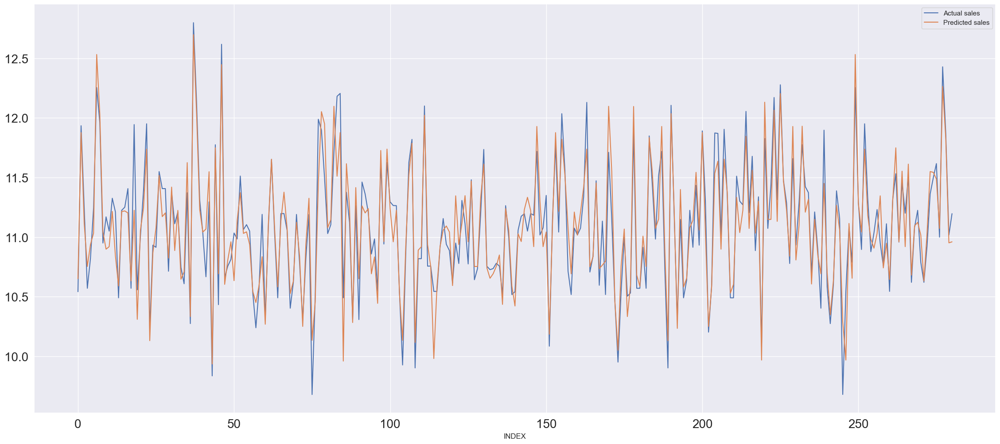

In [242]:

SVR_Model=SVR(C=5,gamma=0.1,kernel='rbf')

SVR_Model_=Main(x,y,X_train, X_test, y_train, y_test)

base_SVR=SVR_Model_.Model_creation(SVR_Model)

<div style="border: 2px solid yellow; border-collapse: collapse;"><b>B)K-fold cross validation Model</b></div>

In [243]:
# result = cross_val_score(SVR_Model ,x ,y , cv = 25)
 
# print("Avg accuracy: {}".format(result.mean()))
# print("Score of the model:- ",result)

<div style="border: 4px solid yellow; border-collapse: collapse;border-style: dotted;"><b>D) XGBOOST</b></div>

In [244]:
from xgboost import XGBRegressor

# XGB=XGBRegressor()
# params = {
#  'learning_rate': np.arange(0.05,0.07,0.01),
#     "gamma":np.arange(0,50,1)
#  }
# XGBO=Main(x,y,X_train, X_test, y_train, y_test)
# gridsearch=XGBO.Grid_search(XGB,params)

In [245]:
# gridsearch

0.8846922568878484
---------------------------------------- SCORE ------------------------------------------------

The Score of test matrics:-  0.8846922568878484

---------------------------------------- R-Squared, RMSE , Adj R-Square  ------------------------------------------------

R-squared: 0.8846922568878484
RMSE: 0.18149569335784188
Adj R-square: 0.8841966648687417
   index  Actual sales  Predicted sales  Error
0    894         10.54            10.56   0.02
1    950         11.93            11.90   0.03
2   1403         11.24            11.15   0.10
3    276         10.57            10.66   0.09
4    222         10.82            10.81   0.01


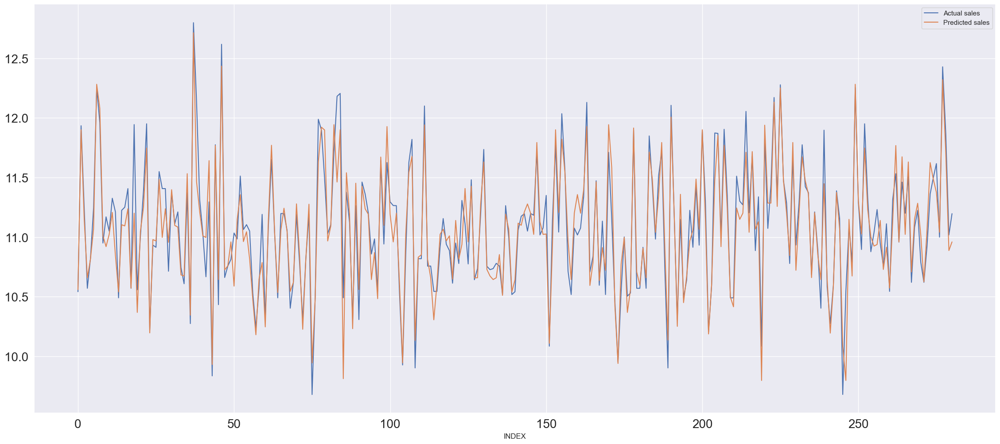

In [246]:
XGB=XGBRegressor(gamma=0,learning_rate=0.07)
XGB_=Main(x,y,X_train, X_test, y_train, y_test)

base_SVR=XGB_.Model_creation(XGB)

In [247]:
# result = cross_val_score(XGB ,x ,y , cv = 25)
 
# print("Avg accuracy: {}".format(result.mean()))
# print("Score of the model:- ",result)

<div id='STACKING' style="border: 4px solid yellow; border-collapse: collapse;border-style: dotted;"><b>Step 17:- STACKING</b></div>

<pre>
<div style="border: 2px solid red; border-collapse: collapse;border-style: solid;">
<b>Note:-</b> . The basic idea behind gradient boosting is to train a sequence of decision trees, where each tree tries to            correct the mistakes made by the previous tree.
    1)knn:-N_neibhour logic
    <b>Type</b>:-Neighbours Logic
    2)Xgboost:- Xgboost works similar to the Decision Tree 
    <b>Type</b>:-Decision Tree
    3)SVR(Support Vector Regression) :- A type of machine learning algorithm that uses support vector machines (SVMs) 
    for  regression analysis.
    <b>Type</b>:-Linear Regression
    4)Extra_tree_Regressor:- Extra_tree_Regressor is nothing a group of Decsion Tree
    <b>Type</b>:-Decision Tree
   </div>
</pre>


In [248]:
x=df1.drop('Prices',axis=1)
y=df1['Prices']
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = scaler.fit_transform(x)
y=np.log(y)
imputer = KNNImputer(n_neighbors=2)
x= imputer.fit_transform(x)
x

array([[ 1.25022902, -0.64909418,  0.1280034 , -0.27312686,  1.06491024,
         0.5138839 ],
       [-2.23846805,  0.13925401,  0.1280034 ,  0.88719708, -0.68049755,
         0.5138839 ],
       [-0.24492687,  0.13925401,  0.1280034 ,  0.30703511, -0.68049755,
        -0.55799019],
       ...,
       [-0.24492687, -0.64909418,  0.1280034 , -0.27312686,  0.01766557,
        -0.68870654],
       [-0.24492687, -0.64909418,  0.1280034 , -0.56320784,  0.01766557,
        -0.68870654],
       [-0.24492687, -0.64909418,  0.1280034 , -0.56320784,  0.01766557,
        -0.68870654]])

In [249]:
from sklearn.ensemble import StackingRegressor

level=[]
level.append(("XGB_Model",XGBRegressor(gamma=0,learning_rate=0.07)))

level.append(("ExtraTree_Model",ExtraTreesRegressor(n_estimators=150,random_state=10,max_depth=16)))
level.append(("KNN_Model",KNeighborsRegressor(leaf_size= 56, metric= 'manhattan', n_neighbors=3)))
level.append(("SVR_Model",SVR(C=5,gamma=0.1,kernel='rbf')))
lin=LinearRegression()

In [250]:
y


0      10.97
1      10.40
2      10.65
3      10.69
4      10.43
        ... 
1399   11.56
1400   10.99
1401   11.20
1402   11.16
1403   11.24
Name: Prices, Length: 1403, dtype: float64

In [251]:
clf_stack = StackingRegressor(estimators=level, final_estimator= lin, cv=25)
clf_stack.fit(x,y)

StackingRegressor(cv=25,
                  estimators=[('XGB_Model',
                               XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=0,
                                            gpu_id=None, grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            le...
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None, ...)),
                              ('ExtraTree_Model',
                               ExtraTreesRegressor(max_depth=16,
                                                   n_estimators=150,
                                                   random_state=10)),
                              ('KNN_Model',
                               KNeighborsRegressor(leaf_size=56,
                                                   metric='manhattan',
                                                   n_neighbors=3)),
                              ('SVR_Model', SVR(C=5, gamma=0.1))],
                  final_estimator=LinearRegression())

In [252]:
result = cross_val_score(clf_stack ,x ,y , cv = 15)
print("Avg accuracy: {}".format(result.mean()))
print("Score of the model:- ",result)

Avg accuracy: 0.8874653966475154
Score of the model:-  [0.90558251 0.92512074 0.92116207 0.94317847 0.97130495 0.93470665
 0.93554567 0.85735501 0.8986361  0.81014968 0.89455066 0.78170134
 0.847691   0.83192797 0.85336815]


In [253]:
import pickle
with open("Laptop_stacking.pkl", "wb") as file:
    pickle.dump(clf_stack, file)

In [254]:

a=clf_stack.predict(X_test)
a

array([11.48518118, 10.58235143, 11.01742624, 11.47321207, 10.96934873,
       11.17215767, 11.25875214, 11.41377023, 11.21021882, 11.40087351,
       11.38982272, 11.40599447, 11.38112921, 11.40063169, 11.41795565,
       11.22982948, 11.1977689 , 11.64869776, 11.24666008, 11.44321463,
       11.54470538, 11.37996163, 10.97698884, 11.33528094, 11.36638146,
       11.29197944, 11.16925092, 11.36848553, 11.1977689 , 11.31028921,
       10.72201657, 11.24846254, 10.72035113, 10.33598749, 11.56443365,
       11.49937658, 11.24574663, 11.90742889, 12.04083288, 11.36467884,
       11.21021882, 11.26827044, 10.72341381, 11.01088639, 10.47522747,
       11.0768465 , 11.07563466, 11.3811343 , 11.5368855 , 11.13252428,
       11.04919031, 11.33141541, 10.45002797, 11.25495127, 11.2851141 ,
       10.96934873, 11.63493678, 10.87601754, 11.26960081, 11.44009006,
       11.47651339, 11.01742624, 10.7771229 , 11.34883882, 11.04787016,
       11.36325614, 11.28413564, 11.34883882, 11.67144636, 11.44

In [255]:
import numpy as np
a=np.log(20000)
np.exp(10.381)

32241.186562787632